In [1]:
rm(list=ls())
gc()
setwd("/hpc/group/pbenfeylab/CheWei/CW_data/genesys/")

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,624160,33.4,1358941,72.6,1335971,71.4
Vcells,1157075,8.9,8388608,64.0,1802277,13.8


In [2]:
## Need seu4
suppressMessages(library(Seurat))
suppressMessages(library(cowplot))
suppressMessages(library(scattermore))
suppressMessages(library(scater))
suppressMessages(library(cowplot))
suppressMessages(library(RColorBrewer))
suppressMessages(library(grid))
suppressMessages(library(gplots))
suppressMessages(library(circular))
suppressMessages(library(ggplot2))
suppressMessages(library(ggnewscale))
suppressMessages(library(tidyverse))
suppressMessages(library(ComplexHeatmap))
suppressMessages(library(circlize))
suppressMessages(library(patchwork))

Warning message:
“package ‘ggplot2’ was built under R version 4.2.3”
Warning message:
“package ‘dplyr’ was built under R version 4.2.3”


In [3]:
sessionInfo()

R version 4.2.2 (2022-10-31)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Stream 8

Matrix products: default
BLAS/LAPACK: /hpc/group/pbenfeylab/ch416/miniconda3/envs/seu4/lib/libopenblasp-r0.3.21.so

locale:
 [1] LC_CTYPE=C.UTF-8           LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] grid      stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] patchwork_1.1.2             circlize_0.4.15            
 [3] ComplexHeatmap_2.14.0       forcats_0.5.2              
 [5] stringr_1.5.0               dplyr_1.1.1                
 [7] purrr_1.0.1                 readr_2.1.3                
 [9] tidyr_1.3.0          

## Load TF list

In [4]:
wanted_TFs <- read.csv("./Kay_TF_thalemine_annotations.csv")

In [5]:
nrow(wanted_TFs)

[1] 2484

In [6]:
## Make TF names unique
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G33880"]="WOX9"
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G45160"]="SCL27"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G04410"]="NAC78"
wanted_TFs$Name[wanted_TFs$GeneID=="AT3G29035"]="ORS1"
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G02540"]="ZHD3"
wanted_TFs$Name[wanted_TFs$GeneID=="AT3G16500"]="IAA26"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G09740"]="HAG5"
wanted_TFs$Name[wanted_TFs$GeneID=="AT4G24660"]="ZHD2"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G46880"]="HDG5"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G28420"]="RLT1"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G14580"]="BLJ"
wanted_TFs$Name[wanted_TFs$GeneID=="AT3G45260"]="BIB"
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G02070"]="RVN"
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G28160"]="FIT"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G68360"]="GIS3"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G20640"]="NLP4"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G05550"]="VFP5"
wanted_TFs$Name[wanted_TFs$GeneID=="AT3G59470"]="FRF1"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G15150"]="HAT7"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G14750"]="WER"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G75710"]="BRON"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G74500"]="TMO7"
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G12646"]="RITF1"
wanted_TFs$Name[wanted_TFs$GeneID=="AT3G48100"]="ARR5"
wanted_TFs$Name[wanted_TFs$GeneID=="AT4G16141"]="GATA17L"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G65640"]="NFL"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G62700"]="VND5"
wanted_TFs$Name[wanted_TFs$GeneID=="AT4G36160"]="VND2"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G66300"]="VND3"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G12260"]="VND4"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G62380"]="VND6"

In [7]:
## TTG1
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G24520"]

[1] "TTG1"

In [8]:
## SCRAMBLED
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G11130"]

character(0)

In [9]:
## CAPRICE
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G46410"]

[1] "CPC"

### Load GRN centrality scores for each transition

In [10]:
stem2pro <- read.csv("./TF_GRN_centrality_t0-t1_zscore3.csv")
pro2trans <- read.csv("./TF_GRN_centrality_t1-t3_zscore3.csv")
trans2el <- read.csv("./TF_GRN_centrality_t3-t5_zscore3.csv")
el2el <- read.csv("./TF_GRN_centrality_t5-t7_zscore3.csv")
el2mat <- read.csv("./TF_GRN_centrality_t7-t9_zscore3.csv")

In [11]:
head(stem2pro)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,GAMMA-H2AX,10,0.8986486,0.3445946,0.55405405,0.824314156,0.001607054,0.11806416,0.80544747,0.12451362,...,0.1495017,0.248917916,0.0011086941,0.06175429,0.07805907,0.02742616,0.05063291,0.31334238,0.0003917786,0.03439140
2,CRF2,9,0.9729730,0.4436937,0.52927928,0.987777846,0.001552485,0.12188729,1.17898833,0.73929961,...,0.3172757,0.630057324,0.0013108166,0.07501625,0.79746835,0.33438819,0.46308017,0.93998481,0.0005974520,0.11139614
3,HMGB6,9,0.2612613,0.2049550,0.05630631,0.002308177,0.001400878,0.06217343,0.45136187,0.28015564,...,0.1029900,0.005635679,0.0009932707,0.04870514,0.03375527,0.01582278,0.01793249,0.00000000,0.0003046752,0.01628732
4,HAT1,9,0.4054054,0.2162162,0.18918919,0.002852175,0.001266005,0.07435692,0.05058366,0.04669261,...,0.4302326,0.967158833,0.0012671678,0.08334429,0.48206751,0.24156118,0.24050633,0.02677119,0.0005415002,0.09398170
5,GRP2B,9,0.2702703,0.1238739,0.14639640,0.038954304,0.001162324,0.06130034,0.00000000,0.00000000,...,0.5332226,0.966937717,0.0012946771,0.08259318,0.67299578,0.41561181,0.25738397,0.28124346,0.0005718634,0.10969489
6,HB-2,9,0.5045045,0.3243243,0.18018018,0.621901247,0.001388507,0.08859595,0.04669261,0.01167315,...,0.3039867,0.856015169,0.0013859050,0.08585141,0.54852321,0.13502110,0.41350211,0.01482474,0.0005300467,0.10354056


In [12]:
min_max_normalize <- function(data) {
  min_val <- min(data)
  max_val <- max(data)
  normalized_data <- (data - min_val) / (max_val - min_val)
  return(normalized_data)
}

In [13]:
summary(stem2pro$tri_betweenness_centrality)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.0236  0.0000  0.9904 

In [14]:
summary(min_max_normalize(stem2pro$tri_betweenness_centrality))

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.00000 0.00000 0.02383 0.00000 1.00000 

In [15]:
ncol(stem2pro)

[1] 62

In [16]:
stem2pro <- as.data.frame(cbind(stem2pro[,1],apply(stem2pro[,3:62],2,min_max_normalize)))
pro2trans <- as.data.frame(cbind(pro2trans[,1],apply(pro2trans[,3:62],2,min_max_normalize)))
trans2el <- as.data.frame(cbind(trans2el[,1],apply(trans2el[,3:62],2,min_max_normalize)))
el2el <- as.data.frame(cbind(el2el[,1],apply(el2el[,3:62],2,min_max_normalize)))
el2mat <- as.data.frame(cbind(el2mat[,1],apply(el2mat[,3:62],2,min_max_normalize)))

In [17]:
dat <- stem2pro %>%
left_join(pro2trans, by = "V1") %>%
left_join(trans2el, by = "V1") %>%
left_join(el2el, by = "V1") %>%
left_join(el2mat, by = "V1") 

In [18]:
dat[is.na(dat)] <- 0

In [19]:
n <- c('atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality',
       'tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality',
       'lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality',
       'cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality',
       'end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality',
       'per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality',
       'pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality',
       'xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality',
       'phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality',
       'col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality')

In [20]:
colnames(dat) <- c("TF",gsub("$","_1",n), gsub("$","_2",n),gsub("$","_3",n),gsub("$","_4",n),gsub("$","_5",n))

In [21]:
GeneID <- wanted_TFs$GeneID[match(dat$TF, wanted_TFs$Name)]

In [22]:
dat <- cbind(GeneID, dat)

In [23]:
head(dat)

,GeneID,TF,atri_degree_centrality_1,atri_out_centrality_1,atri_in_centrality_1,atri_betweenness_centrality_1,atri_closeness_centrality_1,atri_eigenvector_centrality_1,tri_degree_centrality_1,tri_out_centrality_1,...,phl_in_centrality_5,phl_betweenness_centrality_5,phl_closeness_centrality_5,phl_eigenvector_centrality_5,col_degree_centrality_5,col_out_centrality_5,col_in_centrality_5,col_betweenness_centrality_5,col_closeness_centrality_5,col_eigenvector_centrality_5
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,AT1G54690,GAMMA-H2AX,0.776264591439689,0.495145631067961,0.763975155279503,0.834513711603393,0.940151233514354,0.954898795508496,0.63302752293578,0.135593220338983,...,0.00353356890459364,0,0.433778629760381,0.0384080822193205,0,0,0,0,0,0
2,AT4G23750,CRF2,0.840466926070039,0.637540453074434,0.729813664596273,1,0.90822754077444,0.985820114506607,0.926605504587156,0.805084745762712,...,0.0117785630153121,0.0001122768497611,0.579606861231972,0.117223661689331,0,0,0,0,0,0
3,AT5G23420,HMGB6,0.22568093385214,0.294498381877023,0.077639751552795,0.0023367372148563,0.819534761406972,0.502856548739284,0.35474006116208,0.305084745762712,...,0,0,0,0,0,0,0,0,0,0
4,AT4G17460,HAT1,0.350194552529183,0.310679611650485,0.260869565217391,0.00288746602981141,0.740632037115667,0.601396170660393,0.0397553516819572,0.0508474576271186,...,0.00235571260306243,0,0.462623504191286,0.0384080822193205,0.00424088210347752,0.00672268907563025,0.00171232876712329,0,0.534086128307187,0.0342094681539202
5,AT2G21060,GRP2B,0.233463035019455,0.177993527508091,0.201863354037267,0.0394363007494029,0.67997746133997,0.495794974854396,0,0,...,0.156654888103651,0.00484869654894231,0.874134371864073,0.556195610463054,0.00508905852417303,0.00672268907563025,0.00342465753424658,0,0.474466815605091,0.0339845056831895
6,AT4G16780,HB-2,0.43579766536965,0.466019417475728,0.248447204968944,0.629596269455653,0.81229784641811,0.716560956988195,0.036697247706422,0.0127118644067797,...,0.00117785630153121,0,0.398777242871396,0.0289197059513674,0,0,0,0,0,0


In [24]:
numz <- function(x){
    sum(x==0)/length(x)
}

In [25]:
dat$combined_score <- min_max_normalize(rowSums(apply(dat[,grep("centrality",colnames(dat))],2,as.numeric)))
dat$celltype_specificity <- min_max_normalize(apply(apply(dat[,grep("centrality",colnames(dat))],2,as.numeric),1,numz))
dat$weighted_score <- dat$combined_score + dat$celltype_specificity
dat <- dat %>% arrange(desc(weighted_score))

In [26]:
head(dat)

,GeneID,TF,atri_degree_centrality_1,atri_out_centrality_1,atri_in_centrality_1,atri_betweenness_centrality_1,atri_closeness_centrality_1,atri_eigenvector_centrality_1,tri_degree_centrality_1,tri_out_centrality_1,...,phl_eigenvector_centrality_5,col_degree_centrality_5,col_out_centrality_5,col_in_centrality_5,col_betweenness_centrality_5,col_closeness_centrality_5,col_eigenvector_centrality_5,combined_score,celltype_specificity,weighted_score
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>
1,AT5G24800,BZIP9,0,0,0,0,0,0,0,0,...,0.991229312680569,0,0,0,0,0,0,0.7370916,0.6000000,1.337092
2,AT3G43430,AT3G43430,0,0,0,0,0,0,0,0,...,0.481531356662094,0,0,0,0,0,0,0.7528181,0.4978723,1.250690
3,AT5G15150,HAT7,0,0,0,0,0,0,0.253822629969419,0.038135593220339,...,0,0,0,0,0,0,0,0.7999175,0.4425532,1.242471
4,AT3G20840,PLT1,0.961089494163424,0.970873786407767,0.602484472049689,0.976313513958659,0.914746192175766,0.986144172298438,0,0,...,0,0.0398642917726887,0.0756302521008403,0.00342465753424658,0,0.745449540294179,0.250685880776617,0.5516755,0.6680851,1.219761
5,AT5G57620,MYB36,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0.4791306,0.7148936,1.194024
6,AT2G45050,GATA2,1,0.828478964401295,0.801242236024845,0.998594869472124,0.965657213462023,1,0.981651376146789,0.936440677966102,...,0,0,0,0,0,0,0,0.7860795,0.4042553,1.190335


In [784]:
write.csv(dat,"TF_GRN_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=FALSE)

## GO terms (Prepare GS)

In [27]:
gene_list <- read.table('./gene_list_1108.csv', sep=",", header = TRUE)

In [28]:
exptf <- intersect(gene_list$features, wanted_TFs$GeneID)
length(exptf)

[1] 1495

In [29]:
sfun <- read.csv('string_functional_annotations.tsv', sep="\t", header=TRUE)
sann <- read.csv('string_protein_annotations.tsv', sep="\t", header=TRUE)

In [30]:
gsgo1 <- unique(sfun[grep('root|xylem|phloem|procambium|pericycle|vascular|vasculature|stele|tracheary|sieve|trichoblast|atrichoblast|epidermis|epidermal tissue|lateral root cap|root hair|trichome|cortex|endodermis|ground tissue|columella|quiescent center',sfun$term.description, ignore.case=TRUE),]$X.node)
gsgo2 <- unique(sann[grep('root|xylem|phloem|procambium|pericycle|vascular|vasculature|stele|tracheary|sieve|trichoblast|atrichoblast|epidermis|epidermal tissue|lateral root cap|root hair|trichome|cortex|endodermis|ground tissue|columella|quiescent center',sann$domain_summary_url, ignore.case=TRUE),]$X.node)
gsgo <- sort(unique(c(gsgo1, gsgo2)))

In [355]:
#write.csv(data.frame(GeneID=gsgo),"./Gold_Standard_Root_TF_StringDB.csv", quote=FALSE, row.names=FALSE)

In [31]:
length(gsgo)
gsgo

[1] 209

[1] "A0A1I9LNX5"   "AGL12"        "AGL16"        "AHK2"         "AHK3"        
  [6] "AHK4"         "AIL5"         "AL6"          "ANL2"         "APL"         
 [11] "ARF10"        "ARF16"        "ARF17"        "ARF19"        "ARF7"        
 [16] "ARR1"         "ARR10"        "ARR12"        "ARR2"         "ATHB-13"     
 [21] "ATHB-15"      "ATHB-23"      "ATHB-8"       "ATHB-X"       "ATX1-2"      
 [26] "BEH1"         "BHLH12"       "BHLH155"      "BHLH2"        "BHLH32"      
 [31] "BHLH48"       "BHLH54"       "BHLH66"       "BHLH69"       "BHLH82"      
 [36] "BHLH83"       "BHLH85"       "BHLH86"       "BIB"          "BRM"         
 [41] "BZIP19"       "BZIP23"       "BZR2"         "CHC1-2"       "CHR12"       
 [46] "CHR23"        "CPC"          "CRF2"         "DAR2"         "DOF1.1"      
 [51] "DOF2.2"       "DOF2.4"       "DOF3.2"       "DOF3.6"       "DOF5.1"      
 [56] "DOF5.3"       "DOF5.6"       "DOT2"         "DPB"          "E2FB"        
 [61] "EFM"          "ERF055"       "ERF104"       "ET2"          "ETC1"        
 [66] "ETR1"         "F13K3.12"     "F24O1.3"      "F27L4.4"      "F2I11.230"   
 [71] "FEZ"          "GAI"          "GALT2"        "GATA12"       "GATA23"      
 [76] "GIF1"         "GIS3"         "GL2"          "GL3"          "GRF2-2"      
 [81] "GRF3-2"       "GTL1"         "HAG1"         "HAT2"         "HAT4"        
 [86] "HDG11"        "HDG12"        "HDG2"         "HDT1"         "HHO1"        
 [91] "HHO2"         "HHO3"         "HHO6"         "HRS1"         "HSFA4C"      
 [96] "IAA12"        "IAA14"        "IAA20"        "IAA28"        "IAA3"        
[101] "IAA31"        "IAA8"         "IDD4"         "IDD6"         "IWS1"        
[106] "JKD"          "JMJ14"        "JMJ25"        "JMJ30"        "JMJ32"       
[111] "K15E6.5"      "KAN1"         "KNAT7"        "KUA1"         "LBD15"       
[116] "LBD16"        "LBD18"        "LBD29"        "LBD3"         "LBD30"       
[121] "LBD4"         "LDL1"         "LEP"          "LHW"          "LRP1"        
[126] "MAMYB"        "MGP"          "MIF1"         "MTERF9"       "MYB12"       
[131] "MYB124"       "MYB20"        "MYB23"        "MYB32"        "MYB36"       
[136] "MYB43"        "MYB46"        "MYB52"        "MYB60"        "MYB61"       
[141] "MYB7"         "MYB83"        "MYB85"        "MYB86"        "MYB88"       
[146] "MYC3"         "MYC4"         "NAA10"        "NAC003"       "NAC005"      
[151] "NAC007"       "NAC010"       "NAC026"       "NAC030"       "NAC037"      
[156] "NAC043"       "NAC045"       "NAC056"       "NAC075"       "NAC076"      
[161] "NAC083"       "NAC084"       "NAC086"       "NAC101"       "NAC104"      
[166] "NAC105"       "NAC92"        "NUC"          "PKL"          "PLT1"        
[171] "PLT2"         "PRE3"         "Q1G3Q4_ARATH" "RAP2-11"      "RAP2-12"     
[176] "RAV1"         "RBR1"         "REF6"         "REV"          "RGA"         
[181] "SCL22"        "SCL27"        "SCL6"         "SCR"          "SCRM"        
[186] "SHR"          "SMB"          "SOG1"         "T15F16.14"    "T2I1.110"    
[191] "TCP14"        "TCP15"        "TCP9"         "TCX2"         "TCX3"        
[196] "TRY"          "TSO1"         "TTG1"         "UPB1"         "WER"         
[201] "WIP2-2"       "WLIM2B"       "WOX14"        "WRKY13"       "WRKY44"      
[206] "WRKY75"       "ZFP5"         "ZFP6"         "ZFP8"

In [32]:
gsgo <- gsub(",.*$","",gsub("^.*ath:","",sann[match(gsgo, sann$X.node),]$other_names_and_aliases))
gsgo[which(gsgo=='831248')]='AT5G14000'
gsgo

[1] "AT3G53680" "AT1G71692" "AT3G57230" "AT5G35750" "AT1G27320" "AT2G01830"
  [7] "AT5G57390" "AT2G02470" "AT4G00730" "AT1G79430" "AT2G28350" "AT4G30080"
 [13] "AT1G77850" "AT1G19220" "AT5G20730" "AT3G16857" "AT4G31920" "AT2G25180"
 [19] "AT4G16110" "AT1G69780" "AT1G52150" "AT1G26960" "AT4G32880" "AT1G70920"
 [25] "AT2G31650" "AT3G50750" "AT4G00480" "AT2G31280" "AT1G63650" "AT3G25710"
 [31] "AT2G42300" "AT1G27740" "AT2G24260" "AT4G30980" "AT5G58010" "AT1G66470"
 [37] "AT4G33880" "AT5G37800" "AT3G45260" "AT2G46020" "AT4G35040" "AT2G16770"
 [43] "AT1G19350" "AT5G14170" "AT3G06010" "AT5G19310" "AT2G46410" "AT4G23750"
 [49] "AT2G39830" "AT1G07640" "AT2G28810" "AT2G37590" "AT3G45610" "AT3G55370"
 [55] "AT5G02460" "AT5G60200" "AT5G62940" "AT5G16780" "AT5G03415" "AT5G22220"
 [61] "AT2G03500" "AT1G36060" "AT5G61600" "AT5G56780" "AT1G01380" "AT1G66340"
 [67] "AT2G36720" "AT1G62310" "AT2G23780" "AT5G11340" "AT1G26870" "AT1G14920"
 [73] "AT4G21060" "AT5G25830" "AT5G26930" "AT5G28640" "AT1G68360" "AT1G79840"
 [79] "AT5G41315" "AT4G37740" "AT2G36400" "AT1G33240" "AT3G54610" "AT5G47370"
 [85] "AT4G16780" "AT1G73360" "AT1G17920" "AT1G05230" "AT3G44750" "AT3G25790"
 [91] "AT1G68670" "AT1G25550" "AT1G49560" "AT1G13300" "AT5G45710" "AT1G04550"
 [97] "AT4G14550" "AT2G46990" "AT5G25890" "AT1G04240" "AT3G17600" "AT2G22670"
[103] "AT2G02080" "AT1G14580" "AT1G32130" "AT5G03150" "AT4G20400" "AT3G07610"
[109] "AT3G20810" "AT3G45880" "AT5G38840" "AT5G16560" "AT1G62990" "AT5G47390"
[115] "AT2G40470" "AT2G42430" "AT2G45420" "AT3G58190" "AT1G16530" "AT4G00220"
[121] "AT1G31320" "AT1G62830" "AT5G13910" "AT2G27230" "AT5G12330" "AT5G45420"
[127] "AT1G03840" "AT1G74660" "AT5G55580" "AT2G47460" "AT1G14350" "AT1G66230"
[133] "AT5G40330" "AT4G34990" "AT5G57620" "AT5G16600" "AT5G12870" "AT1G17950"
[139] "AT1G08810" "AT1G09540" "AT2G16720" "AT3G08500" "AT4G22680" "AT5G26660"
[145] "AT2G02820" "AT5G46760" "AT4G17880" "AT5G13780" "AT1G02220" "AT1G02250"
[151] "AT1G12260" "AT1G28470" "AT1G62700" "AT1G71930" "AT2G18060" "AT2G46770"
[157] "AT3G03200" "AT3G15510" "AT4G29230" "AT4G36160" "AT5G13180" "AT5G14000"
[163] "AT5G17260" "AT5G62380" "AT5G64530" "AT5G66300" "AT5G39610" "AT5G44160"
[169] "AT2G25170" "AT3G20840" "AT1G51190" "AT1G74500" "AT2G12646" "AT5G19790"
[175] "AT1G53910" "AT1G13260" "AT3G12280" "AT3G48430" "AT5G60690" "AT2G01570"
[181] "AT3G60630" "AT2G45160" "AT4G00150" "AT3G54220" "AT3G26744" "AT4G37650"
[187] "AT1G79580" "AT1G25580" "AT4G08455" "AT5G07400" "AT3G47620" "AT1G69690"
[193] "AT2G45680" "AT4G14770" "AT3G22760" "AT5G53200" "AT3G22780" "AT5G24520"
[199] "AT2G47270" "AT5G14750" "AT3G57670" "AT3G55770" "AT1G20700" "AT4G39410"
[205] "AT2G37260" "AT5G13080" "AT1G10480" "AT1G67030" "AT2G41940"

In [33]:
sann[which(sann$X.node=="HAT7"),]

,X.node,identifier,domain_summary_url,annotation,other_names_and_aliases
,<chr>,<chr>,<chr>,<chr>,<chr>
668,HAT7,3702.Q00466,Homeobox-leucine zipper protein HAT7; Probable transcription factor.,https://smart.embl.de/smart/DDvec.cgi?smart=314:HOX(113|174)+,"831367,AT5G15150,ATHB-3,At5g15150,F8M21_40,HAT7,HAT7_ARATH,HB-3,HD-ZIP protein 7,HD-ZIP protein ATHB-3,Homeobox 3,Homeobox-leucine zipper protein,Homeobox-leucine zipper protein HAT7,Homeodomain transcription factor ATHB-3,Homeodomain-leucine zipper protein HAT7,NM_121519.3,NP_568309,NP_568309.2,Q00466,Q0WNS2,Q9LXG6,ath:AT5G15150"


In [34]:
sann[grep("831248",sann$other_names_and_aliases, ignore.case = TRUE),]

,X.node,identifier,domain_summary_url,annotation,other_names_and_aliases
,<chr>,<chr>,<chr>,<chr>,<chr>
980,NAC084,3702.A0A1P8BAC2,NAC domain containing protein 84.,https://smart.embl.de/smart/DDvec.cgi?smart=262:Pfam_NAM(16|196)+,"831248,A0A1P8BAC2,A0A1P8BAC2_ARATH,At5g14000,MAC12.3,MAC12_3,NAC domain containing protein 84,NAC084,NM_001343305.1,NP_001330278.1,anac084"


## R50

In [35]:
r50 <- 105
numz <- function(x){
    sum(x==0)/length(x)
}

#### GeneSys

In [36]:
genesys <- dat

In [37]:
run_r50_genesys <- function(x){
    genesys$combined_score <- min_max_normalize(rowSums(apply(genesys[,grep(x,colnames(genesys))],2,as.numeric)))
    genesys <- genesys %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(genesys))){
        if (genesys$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [363]:
## all cell type : in centrality + celltype & dev stage specificity
#dat$combined_score <- min_max_normalize(rowSums(apply(dat[,grep("in_centrality",colnames(dat))],2,as.numeric)))
#dat$celltype_specificity <- min_max_normalize(apply(apply(dat[,grep("in_centrality",colnames(dat))],2,as.numeric),1,numz))
#dat$weighted_score <- dat$combined_score + dat$celltype_specificity
#dat <- dat %>% arrange(desc(weighted_score))

#count <- 0
#for (i in seq(nrow(dat))){
#    if (dat$GeneID[i] %in% gsgo){
#        count <- count +1
#        if (count == r50){
#            print(i)
#            break
#        }
#    }
#}

#### CellOracle

In [38]:
prepros <- function(x){
    dat <- read.csv(x)
    #dat <- dat %>% filter(role=="Connector Hub") 
    dat <- dat[,c(1, grep("centrality",colnames(dat)), 22)]
    return(dat)
}

In [39]:
atri <- prepros("../celloracle/atrichoblast_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
tri <- prepros("../celloracle/trichoblast_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
lrc <- prepros("../celloracle/lrc_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
cor <- prepros("../celloracle/cortex_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
end <- prepros("../celloracle/endodermis_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
per <- prepros("../celloracle/pericycle_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
pro <- prepros("../celloracle/procambium_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
xyl <- prepros("../celloracle/xylem_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
phl <- prepros("../celloracle/phloem_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
col <- prepros("../celloracle/columella_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")

In [40]:
dat <- rbind(atri, tri, lrc, cor, end, per, pro, xyl, phl, col)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 closeness_centrality = min_max_normalize(closeness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 closeness_centrality = sum(closeness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:7],2,min_max_normalize))

In [41]:
head(dat)

,GeneID,degree_centrality,in_centrality,out_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AT1G01010,0.0849393998,0.065317964,0.081735954,2.592974e-02,0.3643692412,0.068339145
2,AT1G01030,0.0009542021,0.000000000,0.004447568,0.000000e+00,0.0003449773,0.003632920
3,AT1G01260,0.0233438132,0.000000000,0.033565069,0.000000e+00,0.0872081085,0.016136854
4,AT1G01350,0.0293468347,0.134378356,0.000000000,0.000000e+00,0.0000000000,0.017764785
5,AT1G01380,0.0035614661,0.005492245,0.004573149,7.240465e-05,0.0852853904,0.003752290
6,AT1G01640,0.0060441842,0.023215800,0.000000000,0.000000e+00,0.0000000000,0.006672674


In [42]:
celloracle <- dat

In [43]:
run_r50_celloracle <- function(x){
    celloracle$combined_score <- celloracle[,grep(x,colnames(celloracle))]
    celloracle <- celloracle %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(celloracle))){
        if (celloracle$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [370]:
## all cell type : degree centrality + out centrality + in centrality + betweenness centrality + closeness + eigenvector
#dat$combined_score <- min_max_normalize(rowSums(apply(dat[,grep("centrality",colnames(dat))],2,as.numeric)))
#dat <- dat %>% arrange(desc(combined_score))

#count <- 0
#for (i in seq(nrow(dat))){
#    if (dat$GeneID[i] %in% gsgo){
#        count <- count +1
#        if (count == r50){
#            print(i)
#            break
#        }
#    }
#}

In [371]:
#dat$combined_score <- min_max_normalize(rowSums(apply(dat[,grep("betweenness_centrality|celltype_specificity",colnames(dat))],2,as.numeric)))
#dat <- dat %>% arrange(desc(combined_score))

#count <- 0
#for (i in seq(nrow(dat))){
#    if (dat$GeneID[i] %in% gsgo){
#        count <- count +1
#        if (count == r50){
#            print(i)
#            break
#        }
#    }
#}

#### DE (Root_Atlas)

In [44]:
de <- read.csv("Root_Atlas_DE_Gene_List.csv")

In [45]:
de <- de %>% arrange(pct.diff_rank) %>% arrange(avg_diff_rank)%>% arrange(myAUC_rank)%>% arrange(combined_rank) 

In [46]:
## Remove those not present in the dataset
de <- de[!is.na(match(de$gene.ID,exptf)),]

In [47]:
head(de)

,myAUC,avg_diff,power,pct.1,pct.2,celltype,pseudotime.bin,gene.ID,gene.name,pct.diff,pct.diff_rank,avg_diff_rank,myAUC_rank,combined_rank
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<int>
13,0.901,1.985825,0.802,0.959,0.287,Endodermis,T4,AT5G13910,LEP,0.672,2,4,1,1
40,0.934,2.820810,0.868,0.900,0.155,Procambium,T0,AT1G54690,HTA3,0.745,2,35,2,1
51,0.841,2.351595,0.682,0.881,0.297,Procambium,T1,AT1G25560,TEM1,0.584,1,11,3,1
58,0.979,3.799126,0.958,1.000,0.046,Xylem,T1,AT4G22680,MYB85,0.954,1,7,4,1
63,0.945,4.666402,0.890,0.765,0.054,Phloem,T2,AT3G60530,GATA4,0.711,35,1,5,1
66,0.871,2.623028,0.742,0.877,0.242,Procambium,T2,AT1G66600,WRKY63,0.635,1,5,5,1


In [48]:
dat <- de %>% group_by(gene.ID) %>% reframe(combined_rank = mean(combined_rank),myAUC_rank = mean(myAUC_rank),pct.diff_rank = mean(pct.diff_rank),avg_diff_rank = mean(avg_diff_rank))
dat <- dat %>% arrange(combined_rank)
colnames(dat) <- c("GeneID","combined_rank","myAUC_rank","pct.diff_rank","avg_diff_rank")

In [49]:
head(dat)

GeneID,combined_rank,myAUC_rank,pct.diff_rank,avg_diff_rank
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
AT1G66600,6.500000,19.50000,23.00000,11.50000
AT5G58010,8.333333,9.00000,7.00000,16.00000
AT1G13600,9.500000,42.00000,34.50000,19.50000
AT4G37260,12.333333,10.33333,20.33333,41.66667
AT1G26680,13.000000,73.00000,37.00000,78.00000
AT1G61660,13.000000,19.66667,17.33333,38.33333


In [50]:
de <- dat

In [51]:
run_r50_de <- function(x){
    de$combined_score <- de[,grep(x,colnames(de))]
    de <- de %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(de))){
        if (de$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

#### Plot r50 with ranked by different centrality

In [52]:
## Expressed TFs permutation
R50_permutation <- c()
for (j in 1:1000){
ran <- sample(exptf, length(exptf), replace=FALSE)
count <- 0
for (i in seq(length(ran))){
    if (ran[i] %in% gsgo){
        count <- count +1
        if (count == r50){
            R50_permutation <- c(R50_permutation,i)
            break
        }
    }
}
} 

In [53]:
toplt <- data.frame(Methods=c("GeneSys degree centrality", "GeneSys out centrality", "GeneSys in centrality", "GeneSys betweenness centrality", 
                 "GeneSys closeness centrality", "GeneSys eigenvector centrality","CellOracle degree centrality", "CellOracle out centrality", 
                 "CellOracle in centrality", "CellOracle betweenness centrality", "CellOracle closeness centrality", "CellOracle eigenvector centrality",
                 "DE myAUC rank", "DE pct diff rank", "DE avg diff rank", "Expressed TFs permutation"),
           R50=c(run_r50_genesys('degree_centrality'),run_r50_genesys('out_centrality'),run_r50_genesys('in_centrality'),
                 run_r50_genesys('betweenness_centrality'),run_r50_genesys('closeness_centrality'),run_r50_genesys('eigenvector_centrality'),
                 run_r50_celloracle('degree_centrality'),run_r50_celloracle('out_centrality'),run_r50_celloracle('in_centrality'),
                 run_r50_celloracle('betweenness_centrality'),run_r50_celloracle('closeness_centrality'),run_r50_celloracle('eigenvector_centrality'),
                 run_r50_de('myAUC_rank'),run_r50_de('pct.diff_rank'),run_r50_de('avg_diff_rank'), mean(R50_permutation)))

In [54]:
toplt

Methods,R50
<chr>,<dbl>
GeneSys degree centrality,403.000
GeneSys out centrality,409.000
GeneSys in centrality,383.000
GeneSys betweenness centrality,372.000
GeneSys closeness centrality,695.000
GeneSys eigenvector centrality,460.000
CellOracle degree centrality,479.000
CellOracle out centrality,469.000
CellOracle in centrality,461.000


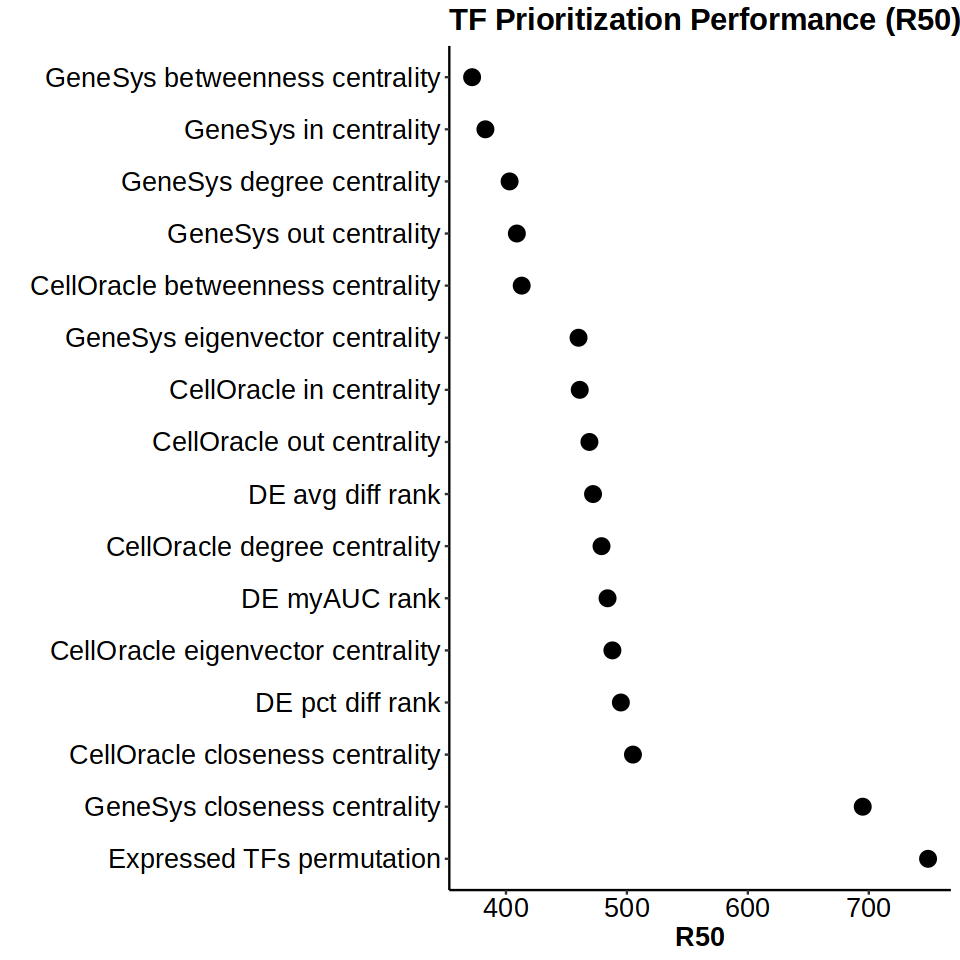

In [55]:
options(repr.plot.width=8, repr.plot.height=8)
ggplot(toplt, aes(x=reorder(Methods, R50, decreasing = TRUE),  y=R50)) + geom_point(size=4)+ 
  labs(title="TF Prioritization Performance (R50)",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

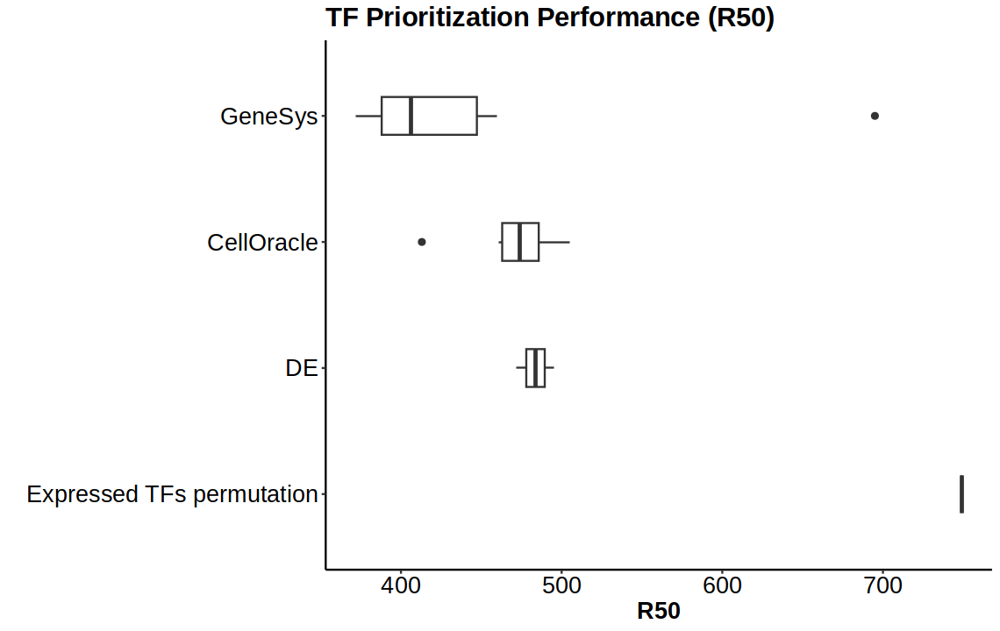

In [56]:
toplt <- data.frame(Methods=factor(c(rep("GeneSys",6), rep("CellOracle",6), rep("DE",3), "Expressed TFs permutation"), 
                                   levels=c("Expressed TFs permutation", "DE", "CellOracle", "GeneSys")), R50=toplt$R50)

options(repr.plot.width=9.5, repr.plot.height=6)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.3)+ 
  labs(title="TF Prioritization Performance (R50)",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

## R50 for Tissue specific TFs

#### Stele (xylem, phloem, procambium) 

In [320]:
gsgo <- read.csv("./Gold_Standard_Root_TF_StringDB.csv", header=TRUE)
gsgo <- gsgo[which(gsgo[,5]=="Yes"),]
gsgo$preferredName
gsgo <- gsgo$GeneID

[1] "APL"    "ATHB-8" "BHLH48" "DAR2"   "DOF5.3" "DOF5.6" "DOT2"   "ERF104"
 [9] "ET2"    "GATA12" "KAN1"   "KNAT7"  "LBD15"  "LBD18"  "LBD30"  "LBD4"  
[17] "LHW"    "MYB20"  "MYB32"  "MYB43"  "MYB46"  "MYB52"  "MYB61"  "MYB7"  
[25] "MYB83"  "MYB85"  "NAC005" "NAC007" "NAC010" "NAC026" "NAC030" "NAC037"
[33] "NAC043" "NAC045" "NAC075" "NAC076" "NAC083" "NAC086" "NAC101" "NAC104"
[41] "NAC105" "REV"    "WOX14"

In [321]:
length(gsgo)

[1] 43

In [322]:
r50 <- 22 

In [323]:
## Define genesys
run_r50_genesys <- function(x){
    genesys$ct_score <- min_max_normalize(rowSums(apply(genesys[,grep(paste0('xyl_',x,'|phl_',x,'|pro_',x),colnames(genesys))],2,as.numeric)))
    genesys$combined_score <- genesys$ct_score
    
    genesys <- genesys %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(genesys))){
        if (genesys$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [324]:
## Define celloracle
dat <- rbind(pro, xyl, phl)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 closeness_centrality = min_max_normalize(closeness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 closeness_centrality = sum(closeness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:7],2,min_max_normalize))

celloracle <- dat

run_r50_celloracle <- function(x){
    celloracle$combined_score <- celloracle[,grep(x,colnames(celloracle))]
    celloracle <- celloracle %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(celloracle))){
        if (celloracle$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [325]:
## Define DE
de <- read.csv("Root_Atlas_DE_Gene_List.csv")
de <- de %>% filter(celltype=="Xylem"|celltype=="Phloem"|celltype=="Procambium")
## Remove those not present in the dataset
de <- de[!is.na(match(de$gene.ID,exptf)),]
dat <- de %>% group_by(gene.ID) %>% reframe(combined_rank = mean(combined_rank),myAUC_rank = mean(myAUC_rank),pct.diff_rank = mean(pct.diff_rank),avg_diff_rank = mean(avg_diff_rank))
dat <- dat %>% arrange(combined_rank)
colnames(dat) <- c("GeneID","combined_rank","myAUC_rank","pct.diff_rank","avg_diff_rank")
de <- dat
run_r50_de <- function(x){
    de$combined_score <- de[,grep(x,colnames(de))]
    de <- de %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(de))){
        if (de$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [326]:
## Expressed TFs permutation
R50_permutation <- c()
for (j in 1:1000){
ran <- sample(exptf, length(exptf), replace=FALSE)
count <- 0
for (i in seq(length(ran))){
    if (ran[i] %in% gsgo){
        count <- count +1
        if (count == r50){
            R50_permutation <- c(R50_permutation,i)
            break
        }
    }
}
} 

In [327]:
toplt <- data.frame(Methods=c("GeneSys degree centrality", "GeneSys out centrality", "GeneSys in centrality", "GeneSys betweenness centrality", 
                 "GeneSys closeness centrality", "GeneSys eigenvector centrality","CellOracle degree centrality", "CellOracle out centrality", 
                 "CellOracle in centrality", "CellOracle betweenness centrality", "CellOracle closeness centrality", "CellOracle eigenvector centrality",
                 "DE myAUC rank", "DE pct diff rank", "DE avg diff rank", "Expressed TFs permutation"),
           R50=c(run_r50_genesys('degree_centrality'),run_r50_genesys('out_centrality'),run_r50_genesys('in_centrality'),
                 run_r50_genesys('betweenness_centrality'),run_r50_genesys('closeness_centrality'),run_r50_genesys('eigenvector_centrality'),
                 run_r50_celloracle('degree_centrality'),run_r50_celloracle('out_centrality'),run_r50_celloracle('in_centrality'),
                 run_r50_celloracle('betweenness_centrality'),run_r50_celloracle('closeness_centrality'),run_r50_celloracle('eigenvector_centrality'),
                 run_r50_de('myAUC_rank'),run_r50_de('pct.diff_rank'),run_r50_de('avg_diff_rank'), mean(R50_permutation)))

In [328]:
toplt

Methods,R50
<chr>,<dbl>
GeneSys degree centrality,94.000
GeneSys out centrality,159.000
GeneSys in centrality,91.000
GeneSys betweenness centrality,137.000
GeneSys closeness centrality,474.000
GeneSys eigenvector centrality,160.000
CellOracle degree centrality,288.000
CellOracle out centrality,255.000
CellOracle in centrality,190.000


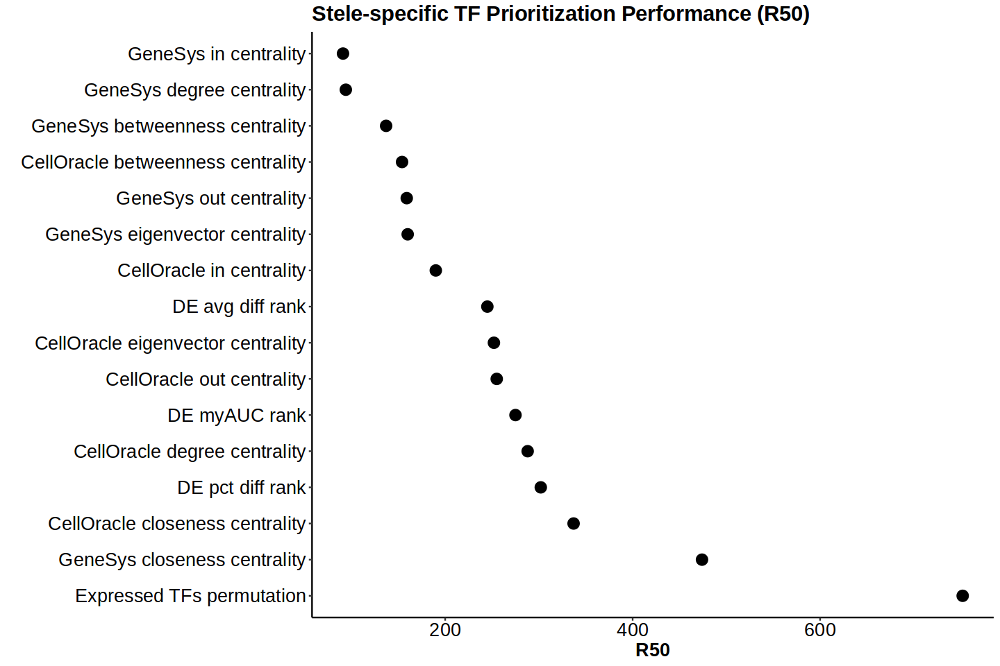

In [298]:
options(repr.plot.width=12, repr.plot.height=8)
ggplot(toplt, aes(x=reorder(Methods, R50, decreasing = TRUE),  y=R50)) + geom_point(size=4)+ 
  labs(title="Stele-specific TF Prioritization Performance (R50)",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

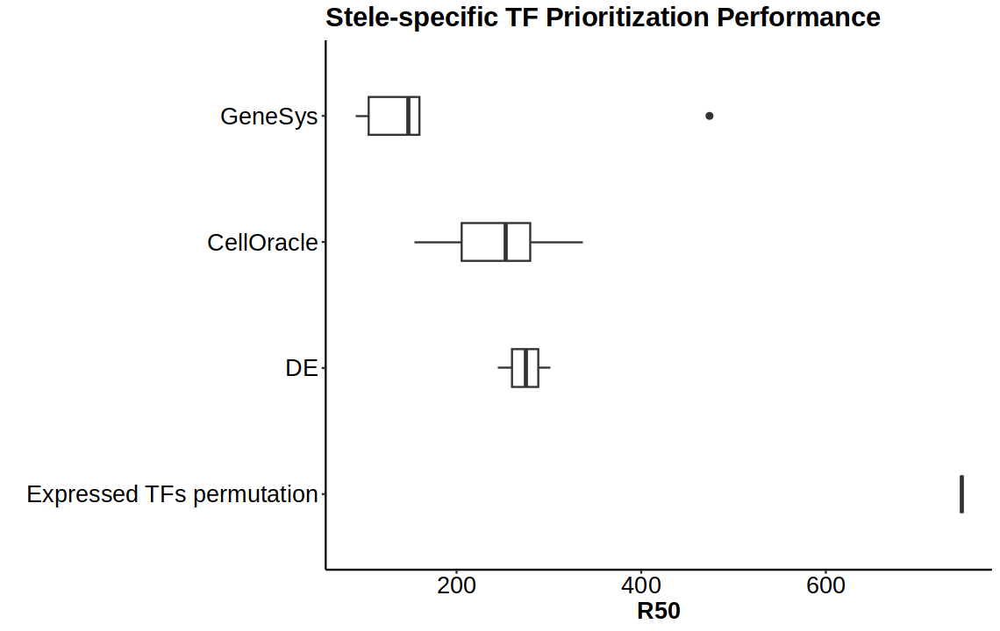

In [329]:
toplt <- data.frame(Methods=factor(c(rep("GeneSys",6), rep("CellOracle",6), rep("DE",3), "Expressed TFs permutation"), 
                                   levels=c("Expressed TFs permutation", "DE", "CellOracle", "GeneSys")), R50=toplt$R50)

options(repr.plot.width=9.5, repr.plot.height=6)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.3)+ 
  labs(title="Stele-specific TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

#### Epidermis

In [305]:
gsgo <- read.csv("./Gold_Standard_Root_TF_StringDB.csv", header=TRUE)
gsgo <- gsgo[which(gsgo[,6]=="Yes"),]
gsgo$preferredName
gsgo <- gsgo$GeneID

[1] "AGL16"  "AL6"    "ANL2"   "BHLH12" "BHLH2"  "BHLH32" "BHLH54" "BHLH66"
 [9] "BHLH69" "BHLH82" "BHLH83" "BHLH85" "BHLH86" "CPC"    "E2FB"   "ETC1"  
[17] "GALT2"  "GIS3"   "GL2"    "GL3"    "GTL1"   "HDG11"  "HDG12"  "HDG2"  
[25] "JMJ25"  "MAMYB"  "MYB124" "MYB23"  "MYB86"  "MYB88"  "MYC3"   "MYC4"  
[33] "RBR1"   "SCL22"  "SCL27"  "SCL6"   "SCRM"   "TCX2"   "TCX3"   "TRY"   
[41] "TSO1"   "TTG1"   "WER"    "WRKY44" "WRKY75" "ZFP5"   "ZFP6"   "ZFP8"

In [306]:
length(gsgo)
r50 <- 24

[1] 48

In [307]:
## Define genesys
run_r50_genesys <- function(x){
    genesys$ct_score <- min_max_normalize(rowSums(apply(genesys[,grep(paste0('atri_',x,'|tri_',x,'|lrc_',x),colnames(genesys))],2,as.numeric)))
    genesys$combined_score <- genesys$ct_score
    
    genesys <- genesys %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(genesys))){
        if (genesys$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [308]:
## Define celloracle
dat <- rbind(atri, tri, lrc)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 closeness_centrality = min_max_normalize(closeness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 closeness_centrality = sum(closeness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:7],2,min_max_normalize))

celloracle <- dat

run_r50_celloracle <- function(x){
    celloracle$combined_score <- celloracle[,grep(x,colnames(celloracle))]
    celloracle <- celloracle %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(celloracle))){
        if (celloracle$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [309]:
## Define DE
de <- read.csv("Root_Atlas_DE_Gene_List.csv")
de <- de %>% filter(celltype=="Atrichoblast"|celltype=="Trichoblast"|celltype=="Lateral Root Cap")
## Remove those not present in the dataset
de <- de[!is.na(match(de$gene.ID,exptf)),]
dat <- de %>% group_by(gene.ID) %>% reframe(combined_rank = mean(combined_rank),myAUC_rank = mean(myAUC_rank),pct.diff_rank = mean(pct.diff_rank),avg_diff_rank = mean(avg_diff_rank))
dat <- dat %>% arrange(combined_rank)
colnames(dat) <- c("GeneID","combined_rank","myAUC_rank","pct.diff_rank","avg_diff_rank")
de <- dat
run_r50_de <- function(x){
    de$combined_score <- de[,grep(x,colnames(de))]
    de <- de %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(de))){
        if (de$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [310]:
## Expressed TFs permutation
R50_permutation <- c()
for (j in 1:1000){
ran <- sample(exptf, length(exptf), replace=FALSE)
count <- 0
for (i in seq(length(ran))){
    if (ran[i] %in% gsgo){
        count <- count +1
        if (count == r50){
            R50_permutation <- c(R50_permutation,i)
            break
        }
    }
}
} 

In [311]:
toplt <- data.frame(Methods=c("GeneSys degree centrality", "GeneSys out centrality", "GeneSys in centrality", "GeneSys betweenness centrality", 
                 "GeneSys closeness centrality", "GeneSys eigenvector centrality","CellOracle degree centrality", "CellOracle out centrality", 
                 "CellOracle in centrality", "CellOracle betweenness centrality", "CellOracle closeness centrality", "CellOracle eigenvector centrality",
                 "DE myAUC rank", "DE pct diff rank", "DE avg diff rank", "Expressed TFs permutation"),
           R50=c(run_r50_genesys('degree_centrality'),run_r50_genesys('out_centrality'),run_r50_genesys('in_centrality'),
                 run_r50_genesys('betweenness_centrality'),run_r50_genesys('closeness_centrality'),run_r50_genesys('eigenvector_centrality'),
                 run_r50_celloracle('degree_centrality'),run_r50_celloracle('out_centrality'),run_r50_celloracle('in_centrality'),
                 run_r50_celloracle('betweenness_centrality'),run_r50_celloracle('closeness_centrality'),run_r50_celloracle('eigenvector_centrality'),
                 999,999,999, mean(R50_permutation)))

In [312]:
toplt

Methods,R50
<chr>,<dbl>
GeneSys degree centrality,288.00
GeneSys out centrality,339.00
GeneSys in centrality,318.00
GeneSys betweenness centrality,329.00
GeneSys closeness centrality,355.00
GeneSys eigenvector centrality,309.00
CellOracle degree centrality,391.00
CellOracle out centrality,365.00
CellOracle in centrality,455.00


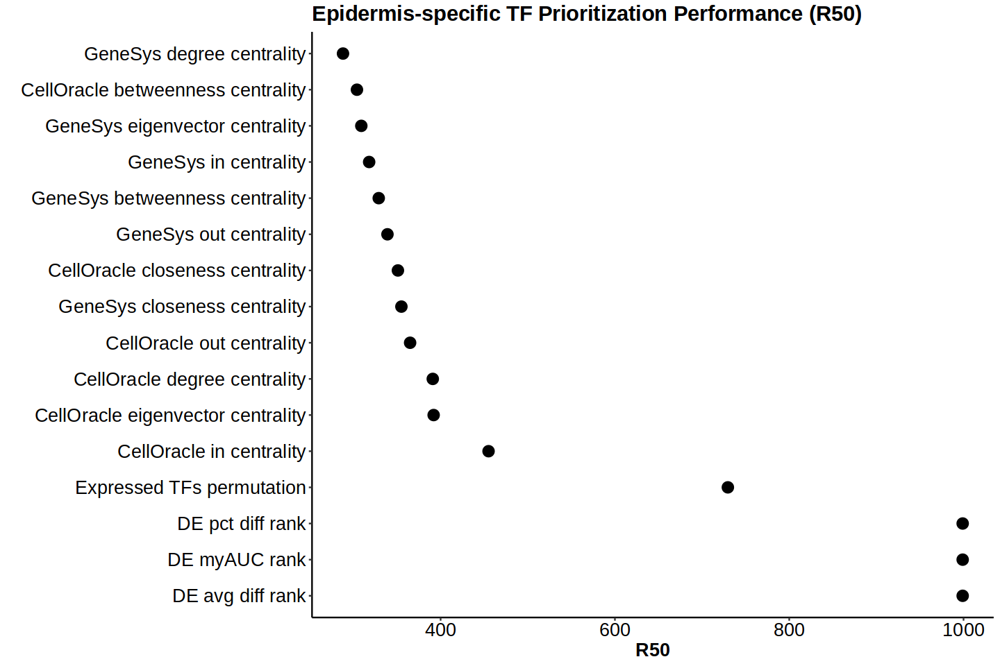

In [313]:
options(repr.plot.width=12, repr.plot.height=8)
ggplot(toplt, aes(x=reorder(Methods, R50, decreasing = TRUE),  y=R50)) + geom_point(size=4)+ 
  labs(title="Epidermis-specific TF Prioritization Performance (R50)",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

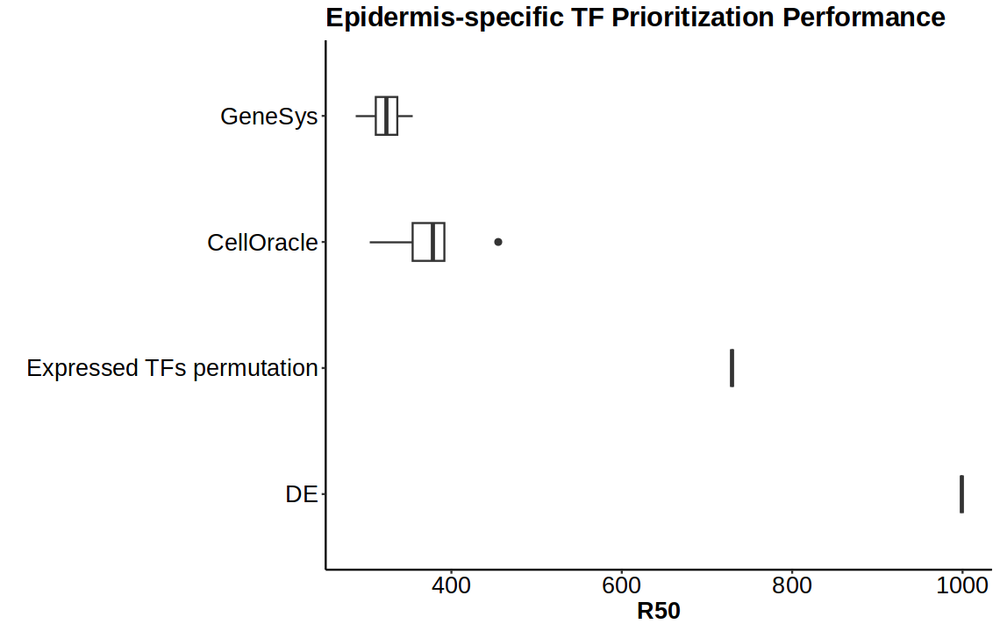

In [319]:
toplt <- data.frame(Methods=factor(c(rep("GeneSys",6), rep("CellOracle",6), rep("DE",3), "Expressed TFs permutation"), 
                                   levels=c("DE","Expressed TFs permutation", "CellOracle", "GeneSys")), R50=toplt$R50)

options(repr.plot.width=9.5, repr.plot.height=6)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.3)+ 
  labs(title="Epidermis-specific TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

## R50 for celltype specific

#### Xylem

In [330]:
gsgo <- read.csv("./Gold_Standard_Root_TF_StringDB.csv", header=TRUE)
gsgo <- gsgo[which(gsgo[,7]=="Yes"),]
gsgo$preferredName
gsgo <- gsgo$GeneID

[1] "APL"    "ATHB-8" "BHLH48" "ET2"    "KNAT7"  "LBD18"  "LBD30"  "LHW"   
 [9] "MYB20"  "MYB32"  "MYB43"  "MYB46"  "MYB52"  "MYB61"  "MYB7"   "MYB83" 
[17] "MYB85"  "NAC005" "NAC007" "NAC010" "NAC026" "NAC030" "NAC037" "NAC043"
[25] "NAC076" "NAC083" "NAC101" "NAC104" "NAC105" "REV"

In [331]:
length(gsgo)
r50 <- 15

[1] 30

In [332]:
## Define genesys
run_r50_genesys <- function(x){
    genesys$ct_score <- min_max_normalize(rowSums(apply(genesys[,grep(paste0('xyl_',x),colnames(genesys))],2,as.numeric)))
    genesys$combined_score <- genesys$ct_score
    
    genesys <- genesys %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(genesys))){
        if (genesys$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [333]:
## Define celloracle
dat <- rbind(xyl)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 closeness_centrality = min_max_normalize(closeness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 closeness_centrality = sum(closeness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:7],2,min_max_normalize))

celloracle <- dat

run_r50_celloracle <- function(x){
    celloracle$combined_score <- celloracle[,grep(x,colnames(celloracle))]
    celloracle <- celloracle %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(celloracle))){
        if (celloracle$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [334]:
## Define DE
de <- read.csv("Root_Atlas_DE_Gene_List.csv")
de <- de %>% filter(celltype=="Xylem")
## Remove those not present in the dataset
de <- de[!is.na(match(de$gene.ID,exptf)),]
dat <- de %>% group_by(gene.ID) %>% reframe(combined_rank = mean(combined_rank),myAUC_rank = mean(myAUC_rank),pct.diff_rank = mean(pct.diff_rank),avg_diff_rank = mean(avg_diff_rank))
dat <- dat %>% arrange(combined_rank)
colnames(dat) <- c("GeneID","combined_rank","myAUC_rank","pct.diff_rank","avg_diff_rank")
de <- dat
run_r50_de <- function(x){
    de$combined_score <- de[,grep(x,colnames(de))]
    de <- de %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(de))){
        if (de$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [335]:
## Expressed TFs permutation
R50_permutation <- c()
for (j in 1:1000){
ran <- sample(exptf, length(exptf), replace=FALSE)
count <- 0
for (i in seq(length(ran))){
    if (ran[i] %in% gsgo){
        count <- count +1
        if (count == r50){
            R50_permutation <- c(R50_permutation,i)
            break
        }
    }
}
} 

In [336]:
toplt <- data.frame(Methods=c("GeneSys degree centrality", "GeneSys out centrality", "GeneSys in centrality", "GeneSys betweenness centrality", 
                 "GeneSys closeness centrality", "GeneSys eigenvector centrality","CellOracle degree centrality", "CellOracle out centrality", 
                 "CellOracle in centrality", "CellOracle betweenness centrality", "CellOracle closeness centrality", "CellOracle eigenvector centrality",
                 "DE myAUC rank", "DE pct diff rank", "DE avg diff rank", "Expressed TFs permutation"),
           R50=c(run_r50_genesys('degree_centrality'),run_r50_genesys('out_centrality'),run_r50_genesys('in_centrality'),
                 run_r50_genesys('betweenness_centrality'),run_r50_genesys('closeness_centrality'),run_r50_genesys('eigenvector_centrality'),
                 run_r50_celloracle('degree_centrality'),run_r50_celloracle('out_centrality'),run_r50_celloracle('in_centrality'),
                 run_r50_celloracle('betweenness_centrality'),run_r50_celloracle('closeness_centrality'),run_r50_celloracle('eigenvector_centrality'),
                 run_r50_de('myAUC_rank'),run_r50_de('pct.diff_rank'),run_r50_de('avg_diff_rank'), mean(R50_permutation)))

In [337]:
toplt

Methods,R50
<chr>,<dbl>
GeneSys degree centrality,30.000
GeneSys out centrality,65.000
GeneSys in centrality,27.000
GeneSys betweenness centrality,54.000
GeneSys closeness centrality,47.000
GeneSys eigenvector centrality,37.000
CellOracle degree centrality,90.000
CellOracle out centrality,88.000
CellOracle in centrality,65.000


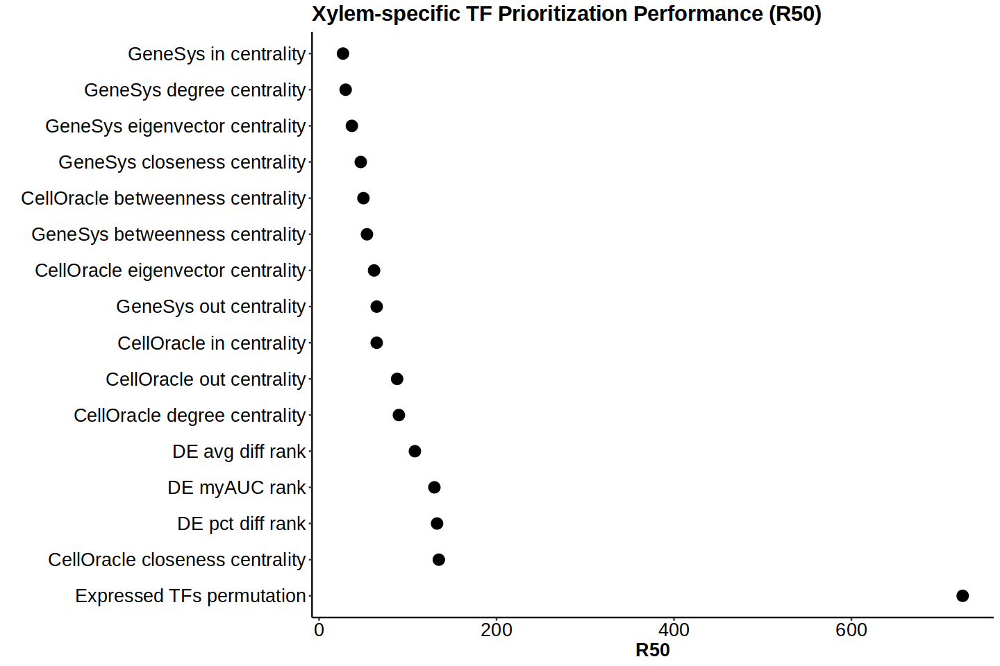

In [338]:
options(repr.plot.width=12, repr.plot.height=8)
ggplot(toplt, aes(x=reorder(Methods, R50, decreasing = TRUE),  y=R50)) + geom_point(size=4)+ 
  labs(title="Xylem-specific TF Prioritization Performance (R50)",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

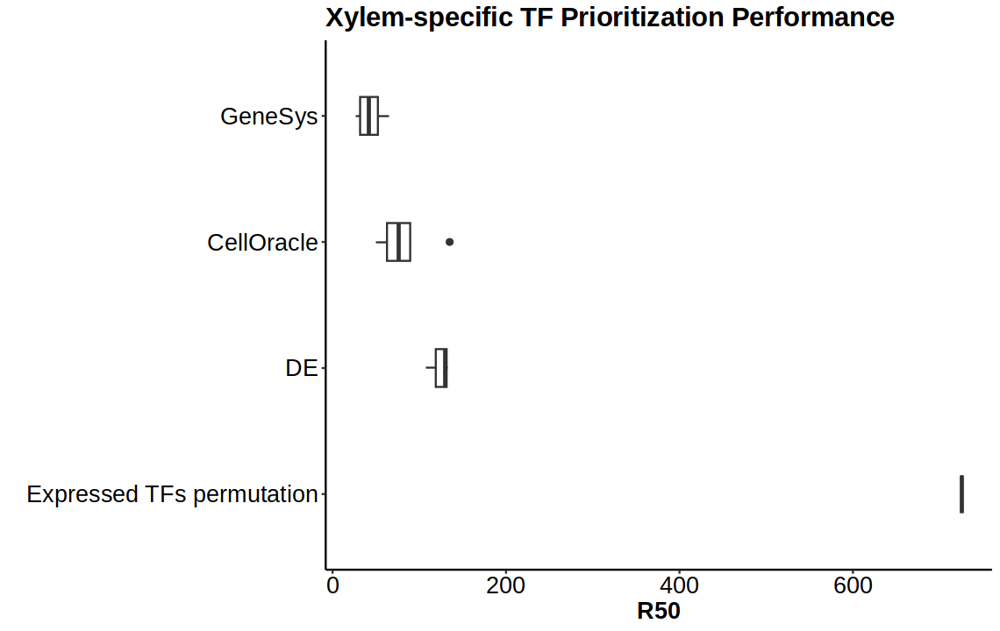

In [340]:
toplt <- data.frame(Methods=factor(c(rep("GeneSys",6), rep("CellOracle",6), rep("DE",3), "Expressed TFs permutation"), 
                                   levels=c("Expressed TFs permutation","DE", "CellOracle", "GeneSys")), R50=toplt$R50)

options(repr.plot.width=9.5, repr.plot.height=6)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.3)+ 
  labs(title="Xylem-specific TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

#### Trichoblast

In [341]:
gsgo <- read.csv("./Gold_Standard_Root_TF_StringDB.csv", header=TRUE)
gsgo <- gsgo[which(gsgo[,8]=="Yes"),]
gsgo$preferredName
gsgo <- gsgo$GeneID

[1] "AL6"    "ANL2"   "BHLH12" "BHLH2"  "BHLH32" "BHLH54" "BHLH66" "BHLH69"
 [9] "BHLH82" "BHLH83" "BHLH85" "BHLH86" "CPC"    "E2FB"   "ETC1"   "GALT2" 
[17] "GIS3"   "GL2"    "GL3"    "GTL1"   "HDG11"  "HDG12"  "HDG2"   "MAMYB" 
[25] "MYB23"  "MYB86"  "RBR1"   "SCL22"  "SCL27"  "SCL6"   "TRY"    "TTG1"  
[33] "WER"    "ZFP5"   "ZFP6"   "ZFP8"

In [342]:
length(gsgo)
r50 <- 18

[1] 36

In [343]:
## Define genesys
run_r50_genesys <- function(x){
    genesys$ct_score <- min_max_normalize(rowSums(apply(genesys[,grep(paste0('^tri_',x),colnames(genesys))],2,as.numeric)))
    genesys$combined_score <- genesys$ct_score
    
    genesys <- genesys %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(genesys))){
        if (genesys$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [344]:
## Define celloracle
dat <- rbind(tri)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 closeness_centrality = min_max_normalize(closeness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 closeness_centrality = sum(closeness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:7],2,min_max_normalize))

celloracle <- dat

run_r50_celloracle <- function(x){
    celloracle$combined_score <- celloracle[,grep(x,colnames(celloracle))]
    celloracle <- celloracle %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(celloracle))){
        if (celloracle$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [345]:
## Define DE
de <- read.csv("Root_Atlas_DE_Gene_List.csv")
de <- de %>% filter(celltype=="Trichoblast")
## Remove those not present in the dataset
de <- de[!is.na(match(de$gene.ID,exptf)),]
dat <- de %>% group_by(gene.ID) %>% reframe(combined_rank = mean(combined_rank),myAUC_rank = mean(myAUC_rank),pct.diff_rank = mean(pct.diff_rank),avg_diff_rank = mean(avg_diff_rank))
dat <- dat %>% arrange(combined_rank)
colnames(dat) <- c("GeneID","combined_rank","myAUC_rank","pct.diff_rank","avg_diff_rank")
de <- dat
run_r50_de <- function(x){
    de$combined_score <- de[,grep(x,colnames(de))]
    de <- de %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(de))){
        if (de$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [346]:
## Expressed TFs permutation
R50_permutation <- c()
for (j in 1:1000){
ran <- sample(exptf, length(exptf), replace=FALSE)
count <- 0
for (i in seq(length(ran))){
    if (ran[i] %in% gsgo){
        count <- count +1
        if (count == r50){
            R50_permutation <- c(R50_permutation,i)
            break
        }
    }
}
} 

In [347]:
toplt <- data.frame(Methods=c("GeneSys degree centrality", "GeneSys out centrality", "GeneSys in centrality", "GeneSys betweenness centrality", 
                 "GeneSys closeness centrality", "GeneSys eigenvector centrality","CellOracle degree centrality", "CellOracle out centrality", 
                 "CellOracle in centrality", "CellOracle betweenness centrality", "CellOracle closeness centrality", "CellOracle eigenvector centrality",
                 "DE myAUC rank", "DE pct diff rank", "DE avg diff rank", "Expressed TFs permutation"),
           R50=c(run_r50_genesys('degree_centrality'),run_r50_genesys('out_centrality'),run_r50_genesys('in_centrality'),
                 run_r50_genesys('betweenness_centrality'),run_r50_genesys('closeness_centrality'),run_r50_genesys('eigenvector_centrality'),
                 run_r50_celloracle('degree_centrality'),run_r50_celloracle('out_centrality'),run_r50_celloracle('in_centrality'),
                 run_r50_celloracle('betweenness_centrality'),run_r50_celloracle('closeness_centrality'),run_r50_celloracle('eigenvector_centrality'),
                 999,999,999, mean(R50_permutation)))

In [348]:
toplt

Methods,R50
<chr>,<dbl>
GeneSys degree centrality,267.000
GeneSys out centrality,244.000
GeneSys in centrality,228.000
GeneSys betweenness centrality,325.000
GeneSys closeness centrality,398.000
GeneSys eigenvector centrality,278.000
CellOracle degree centrality,508.000
CellOracle out centrality,476.000
CellOracle in centrality,425.000


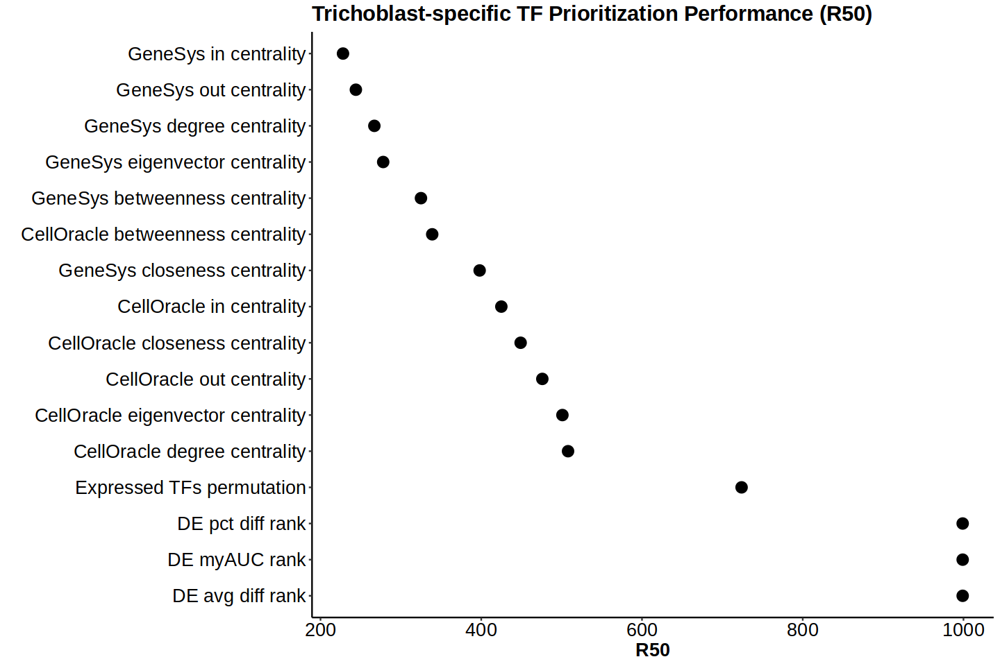

In [349]:
options(repr.plot.width=12, repr.plot.height=8)
ggplot(toplt, aes(x=reorder(Methods, R50, decreasing = TRUE),  y=R50)) + geom_point(size=4)+ 
  labs(title="Trichoblast-specific TF Prioritization Performance (R50)",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

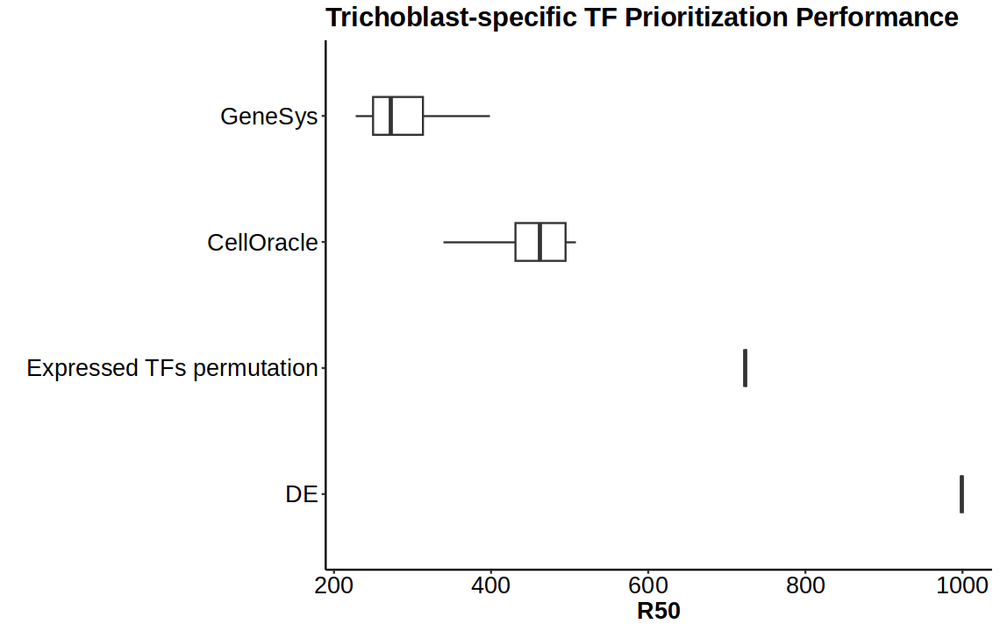

In [350]:
toplt <- data.frame(Methods=factor(c(rep("GeneSys",6), rep("CellOracle",6), rep("DE",3), "Expressed TFs permutation"), 
                                   levels=c("DE","Expressed TFs permutation", "CellOracle", "GeneSys")), R50=toplt$R50)

options(repr.plot.width=9.5, repr.plot.height=6)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.3)+ 
  labs(title="Trichoblast-specific TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

## Plotting

In [41]:
dat <- genesys

In [42]:
plot_heatmap <- function(gene, centrality){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep(centrality,colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = TRUE, name = paste0(gene,"\n","weighted","\n","network","\n","centrality"),
            col = col_fun, column_title = paste0(str_split_i(centrality,"_",1),"\n",str_split_i(centrality,"_",2)), column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [43]:
plot_heatmap2 <- function(gene, centrality){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep(centrality,colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title = "out degree \n centrality", column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [44]:
plot_heatmap3 <- function(gene, centrality){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep(centrality,colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1), name = paste0("unweighted","\n","network","\n","centrality"),
            col = col_fun, column_title = "in degree \n centrality", column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [45]:
plot_all_centrality <- function(gene){
    options(repr.plot.width=10, repr.plot.height=6)
    plot_heatmap(gene,"betweenness_centrality") + plot_heatmap2(gene,"out_centrality") + plot_heatmap3(gene,"in_centrality")
}

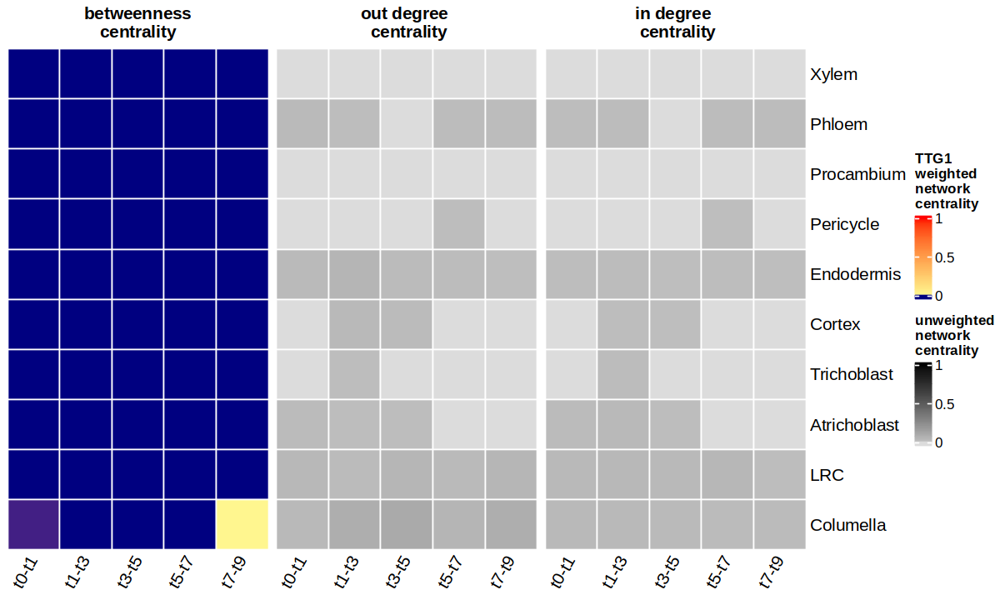

In [46]:
plot_all_centrality("TTG1")

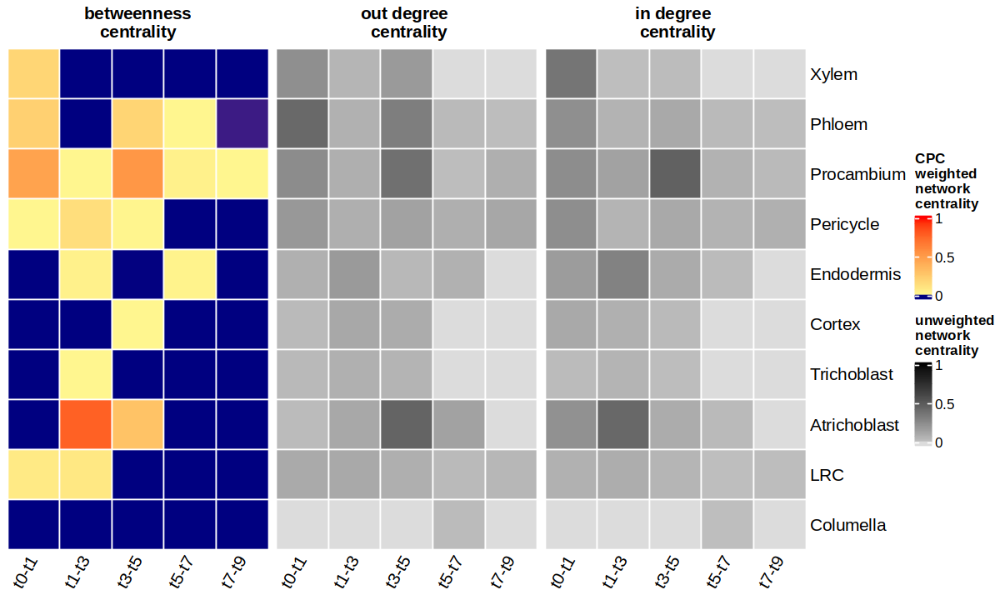

In [47]:
plot_all_centrality("CPC")

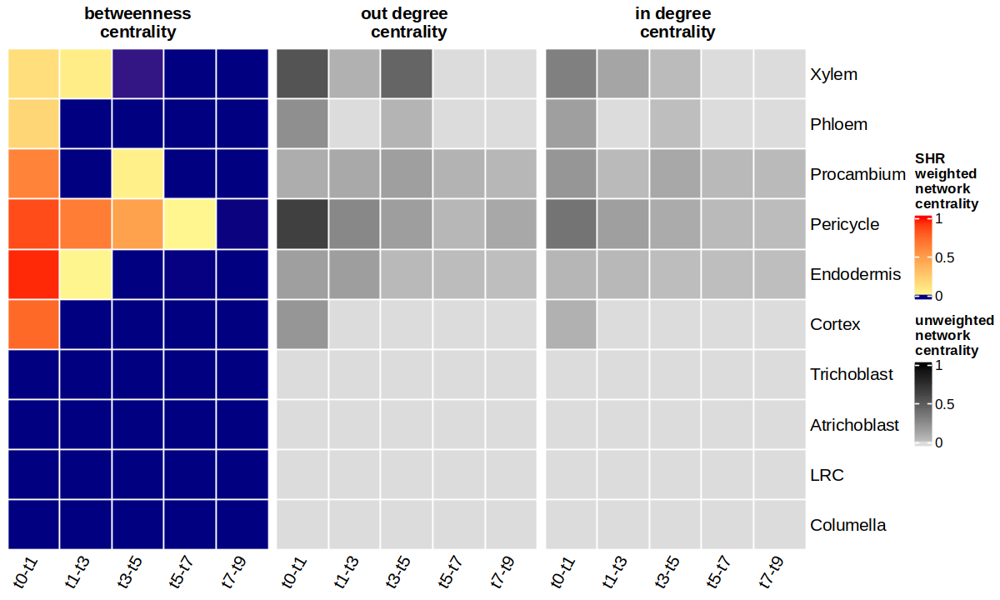

In [1212]:
plot_all_centrality("SHR")

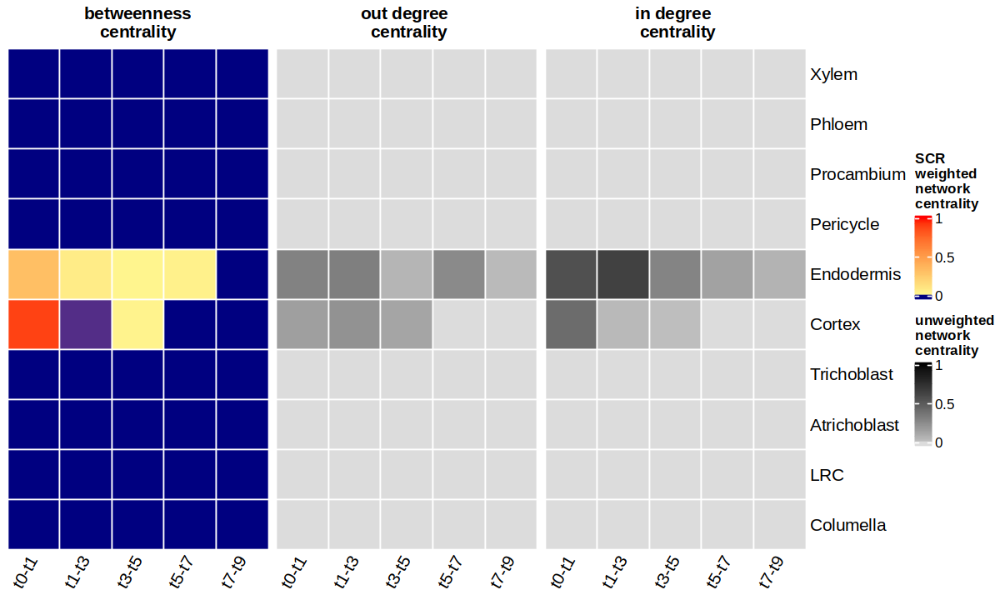

In [1213]:
plot_all_centrality("SCR")

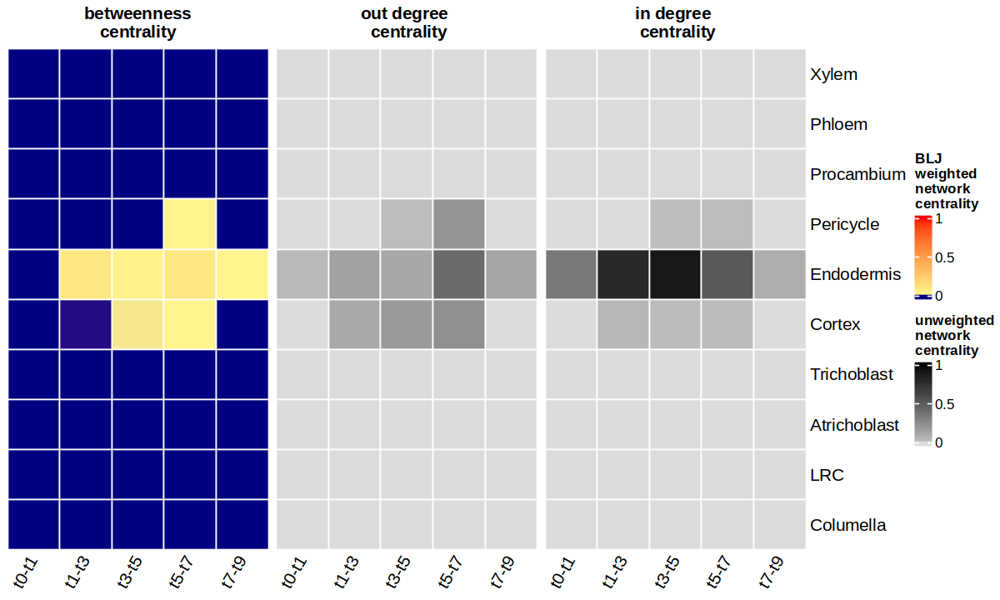

In [1214]:
plot_all_centrality("BLJ")

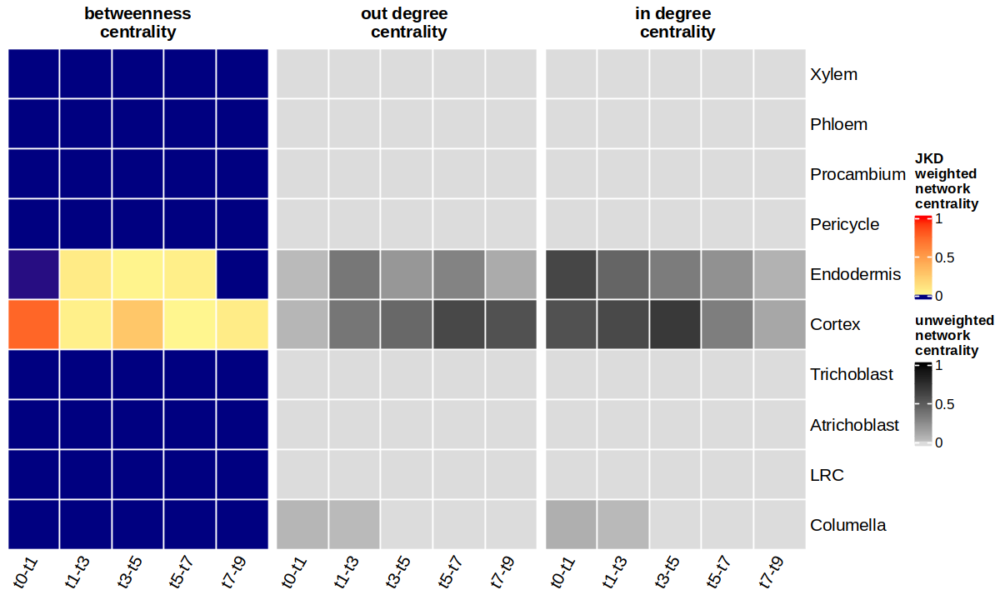

In [1215]:
plot_all_centrality("JKD")

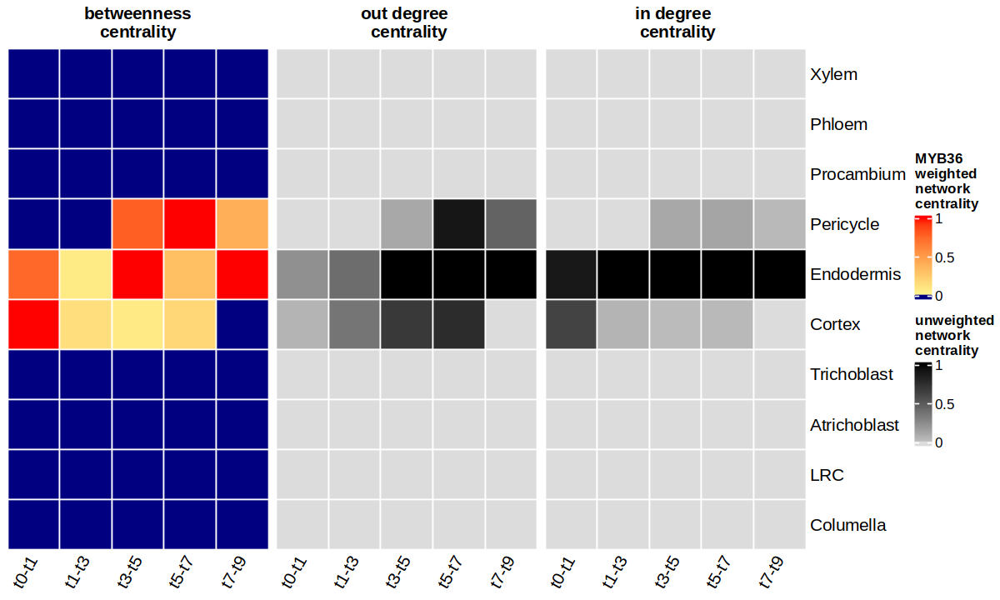

In [1216]:
plot_all_centrality("MYB36")

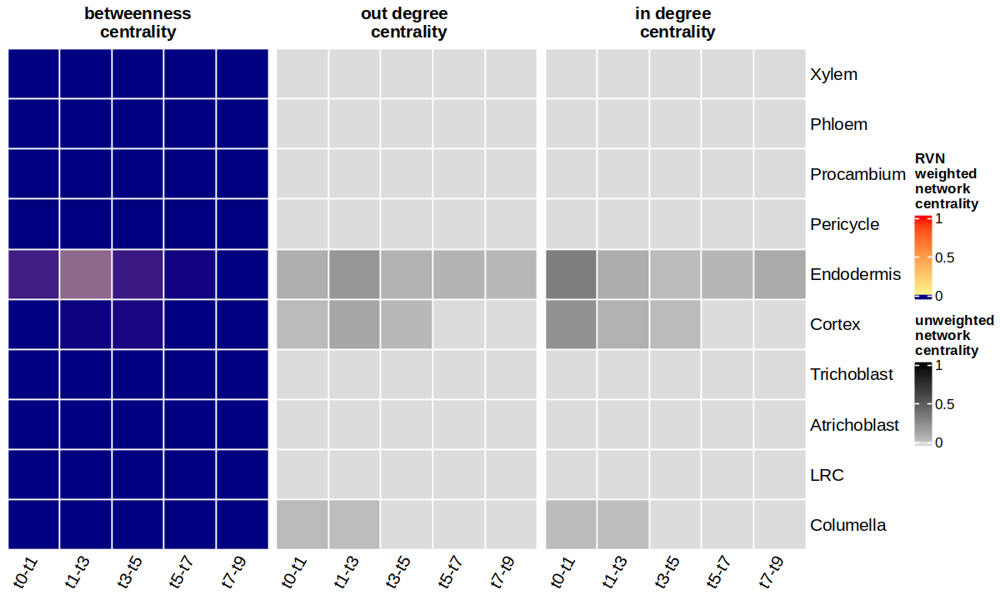

In [1217]:
plot_all_centrality("RVN")

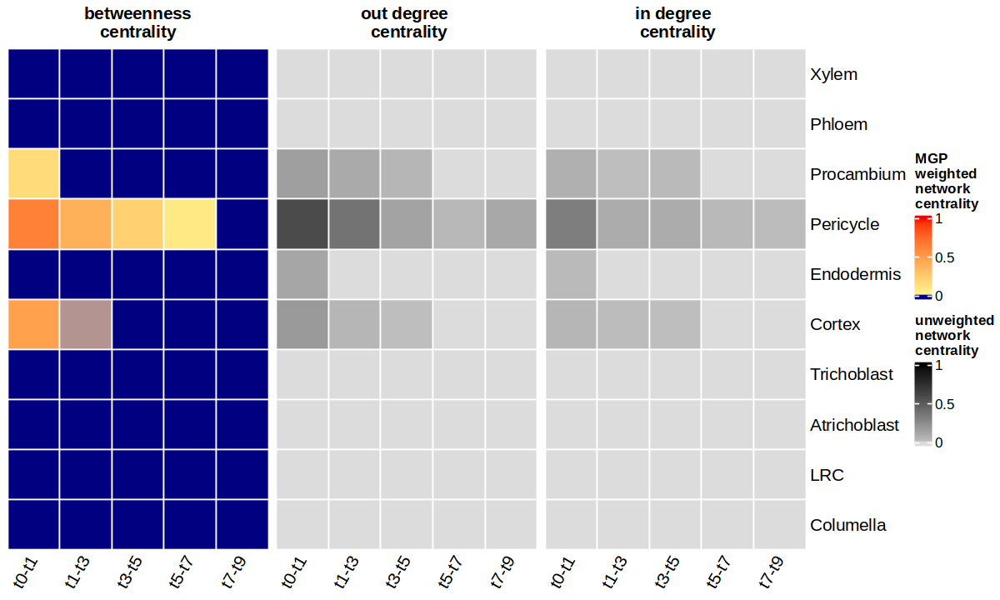

In [1218]:
plot_all_centrality("MGP")

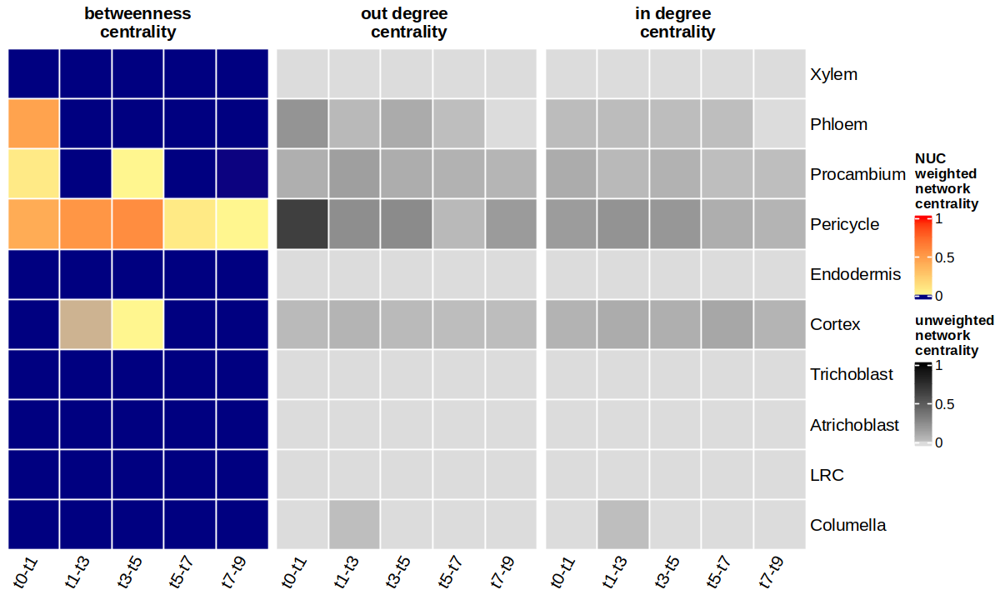

In [1219]:
plot_all_centrality("NUC")

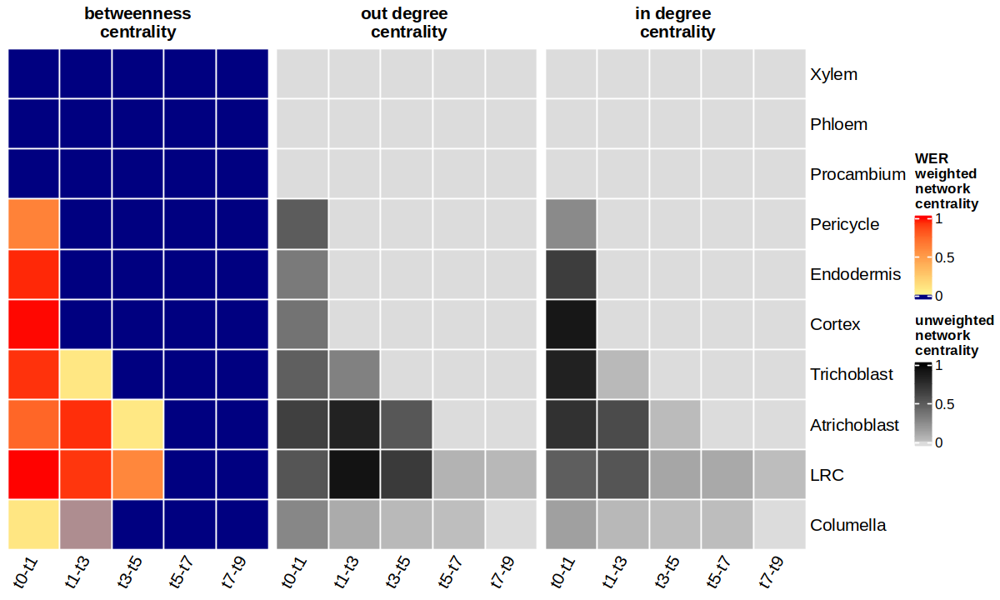

In [1220]:
plot_all_centrality("WER")

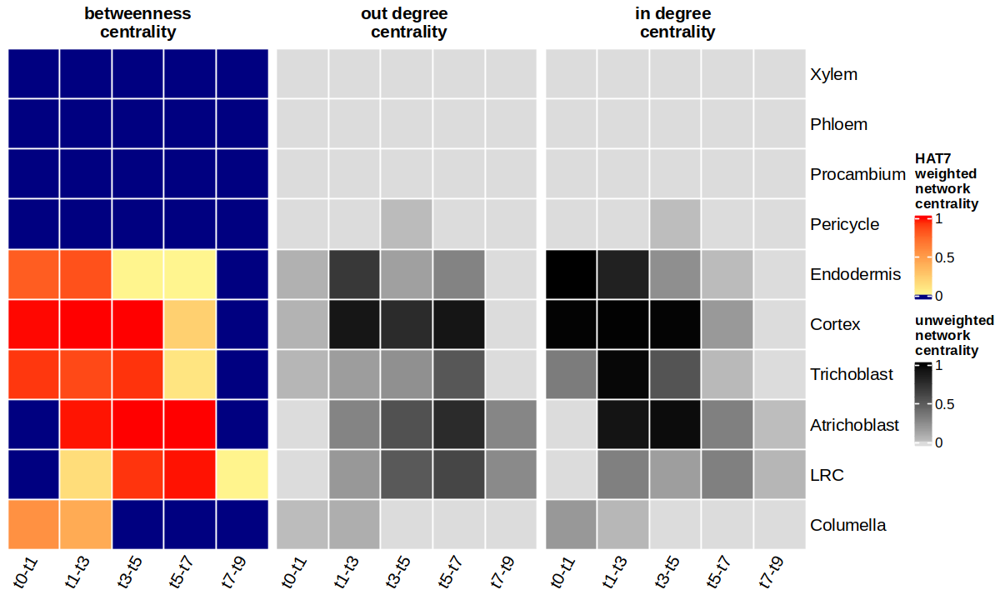

In [1221]:
## HAT7
plot_all_centrality("HAT7")

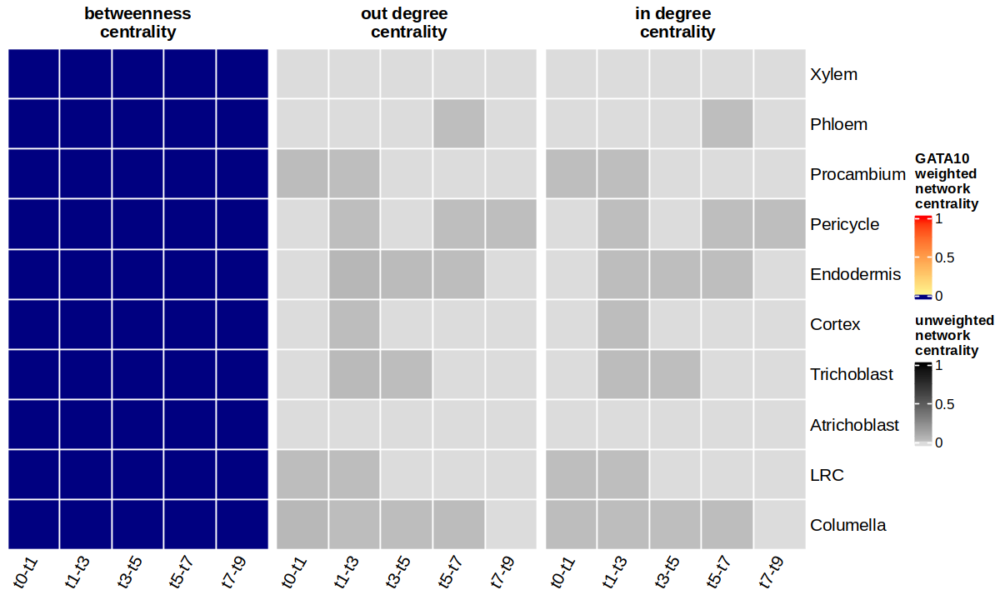

In [1222]:
## GATA10
plot_all_centrality("GATA10")

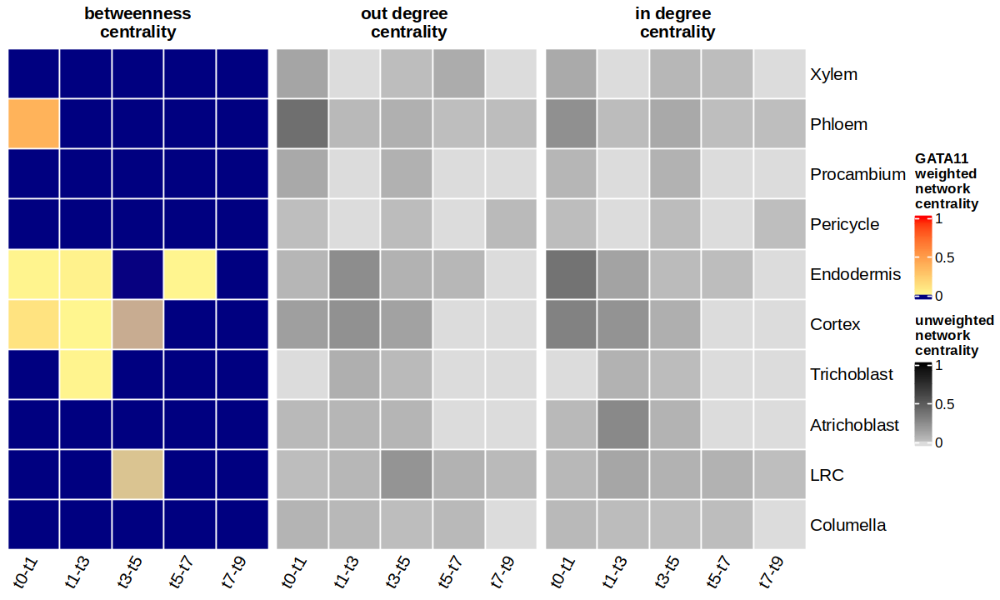

In [1223]:
## GATA11
plot_all_centrality("GATA11")

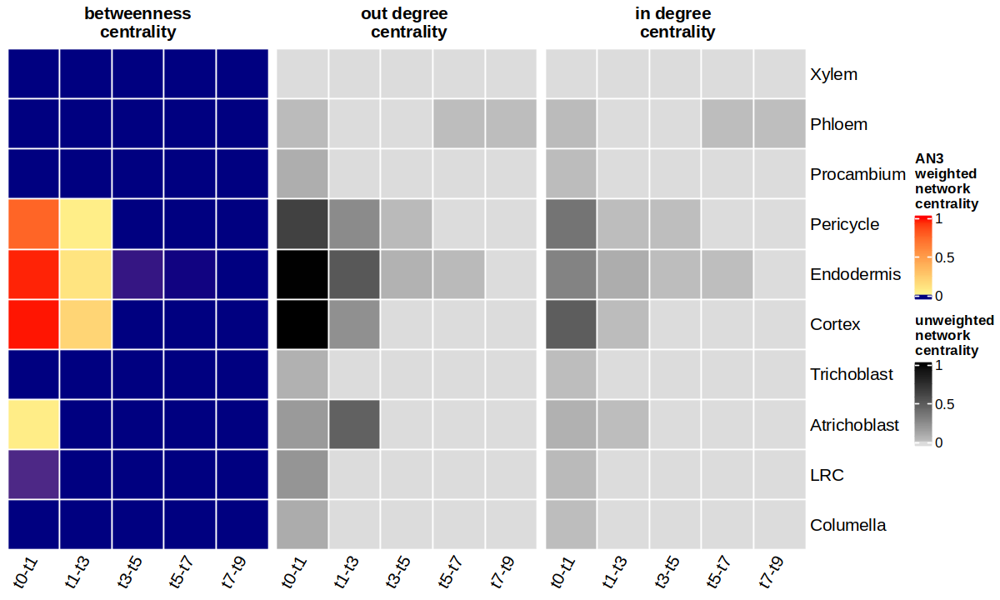

In [1224]:
plot_all_centrality("AN3")

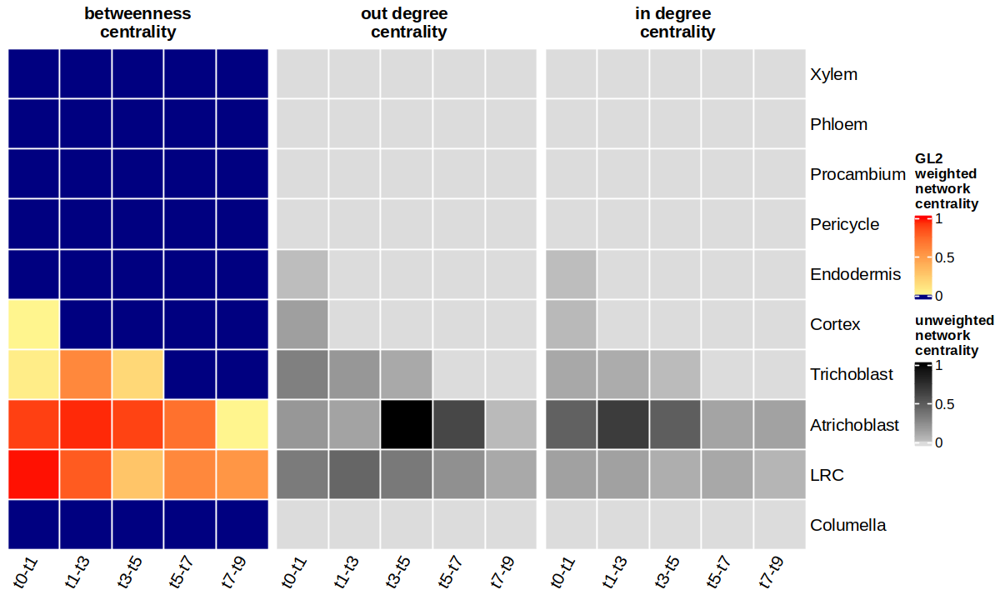

In [1225]:
plot_all_centrality("GL2")

In [192]:
plot_all_centrality <- function(gene){
    options(repr.plot.width=8, repr.plot.height=4)
    plot_heatmap(gene,"betweenness_centrality") + plot_heatmap2(gene,"out_centrality") + plot_heatmap3(gene,"in_centrality")
}

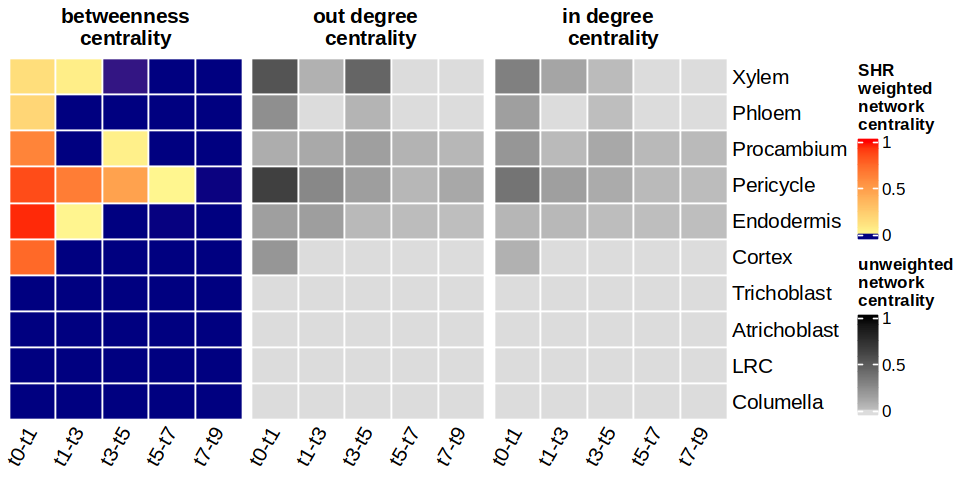

In [193]:
plot_all_centrality("SHR")

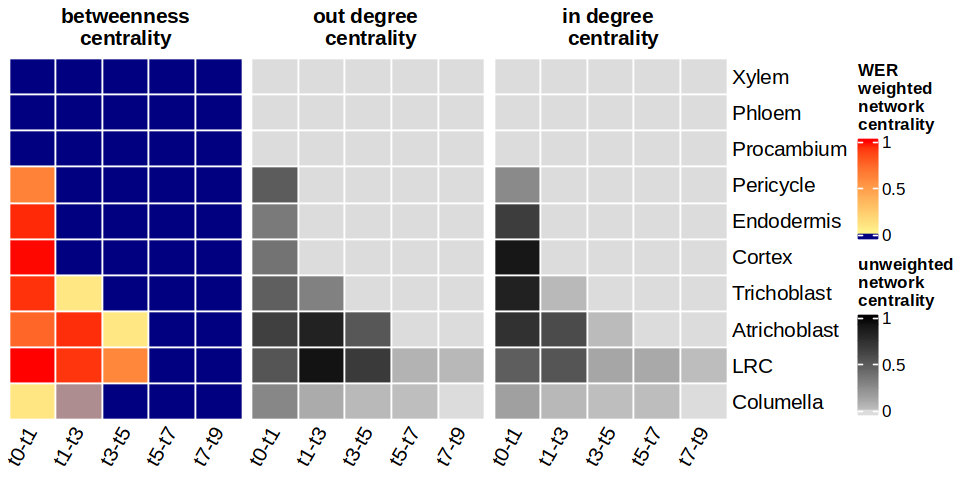

In [235]:
plot_all_centrality("WER")

## Rank by betweenness centrality, out-degree centrality, in-degree centrality and degree centrality

In [49]:
plot_bc <- function(gene){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep("betweenness_centrality",colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title = gene, column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [50]:
plot_oc <- function(gene){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep("out_centrality",colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title = gene, column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [51]:
plot_ic <- function(gene){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep("in_centrality",colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title = gene, column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [52]:
plot_dc <- function(gene){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep("degree_centrality",colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title = gene, column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [53]:
plot_blank <- function(gene){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep("betweenness_centrality",colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('white',"white", "white"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, show_row_names = TRUE
       )
}

In [54]:
# Combine the top three centralies 
sub <- dat[,grep("betweenness_centrality|in_centrality|out_centrality",colnames(dat))]
sub <- as.data.frame(sapply(sub, as.numeric))
rownames(sub) <- dat$TF

In [55]:
head(sub)

,atri_out_centrality_1,atri_in_centrality_1,atri_betweenness_centrality_1,tri_out_centrality_1,tri_in_centrality_1,tri_betweenness_centrality_1,lrc_out_centrality_1,lrc_in_centrality_1,lrc_betweenness_centrality_1,cor_out_centrality_1,...,pro_betweenness_centrality_5,xyl_out_centrality_5,xyl_in_centrality_5,xyl_betweenness_centrality_5,phl_out_centrality_5,phl_in_centrality_5,phl_betweenness_centrality_5,col_out_centrality_5,col_in_centrality_5,col_betweenness_centrality_5
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
BZIP9,0.0000000,0.0000000,0.0000000,0.00000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.000000000,...,1.0000000,0,0,0,0.7429245,0.88928151,0.08846168,0.00000000,0.000000000,0
AT3G43430,0.0000000,0.0000000,0.0000000,0.00000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.002298851,...,0.3216776,0,0,0,0.1450472,0.06831567,0.05658337,0.00000000,0.000000000,0
HAT7,0.0000000,0.0000000,0.0000000,0.03813559,0.3274336,0.9204856,0.0000000,0.0000000,0.0000000,0.052873563,...,0.0000000,0,0,0,0.0000000,0.00000000,0.00000000,0.00000000,0.000000000,0
PLT1,0.9708738,0.6024845,0.9763135,0.00000000,0.0000000,0.0000000,0.3452055,1.0000000,0.9765895,0.696551724,...,0.0000000,0,0,0,0.0000000,0.00000000,0.00000000,0.07563025,0.003424658,0
MYB36,0.0000000,0.0000000,0.0000000,0.00000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.050574713,...,0.0000000,0,0,0,0.0000000,0.00000000,0.00000000,0.00000000,0.000000000,0
GATA2,0.8284790,0.8012422,0.9985949,0.93644068,0.4424779,0.9416342,0.6739726,0.7235772,0.8874613,0.533333333,...,0.0000000,0,0,0,0.0000000,0.00000000,0.00000000,0.00000000,0.000000000,0


In [56]:
bc_rank <- data.frame(all=rowSums(sub),atri=rowSums(sub[,grep("^atri_",colnames(sub))]),tri=rowSums(sub[,grep("^tri_",colnames(sub))])
                     ,cor=rowSums(sub[,grep("^cor_",colnames(sub))]),end=rowSums(sub[,grep("^end_",colnames(sub))])
                     ,per=rowSums(sub[,grep("^per_",colnames(sub))]),pro=rowSums(sub[,grep("^pro_",colnames(sub))])
                     ,xyl=rowSums(sub[,grep("^xyl_",colnames(sub))]),phl=rowSums(sub[,grep("^phl_",colnames(sub))])
                     ,lrc=rowSums(sub[,grep("^lrc_",colnames(sub))]),col=rowSums(sub[,grep("^col_",colnames(sub))]))

In [57]:
bc_rank$GeneID <- wanted_TFs$GeneID[match(rownames(bc_rank),wanted_TFs$Name)]

In [66]:
head(bc_rank)

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
BZIP9,31.71447,0.000000,0.000000,0.000000000,0.006698565,8.04635576,11.94430365,0.03622764,11.6808854,0.000000,0.000000,AT5G24800
AT3G43430,29.50134,0.000000,0.000000,0.005375774,0.006698565,8.92414305,10.03369110,3.50786160,7.0235724,0.000000,0.000000,AT3G43430
HAT7,32.32415,7.054065,5.626399,8.996598123,4.910315271,0.02122024,0.00000000,0.00000000,0.0000000,4.433060,1.282490,AT5G15150
PLT1,22.94342,3.573806,0.000000,2.592117793,1.958605076,0.00000000,0.00000000,0.00000000,0.0000000,9.283443,5.535445,AT3G20840
MYB36,19.51309,0.000000,0.000000,3.965572845,11.648226873,3.89929436,0.00000000,0.00000000,0.0000000,0.000000,0.000000,AT5G57620
GATA2,30.67747,7.853413,5.533161,2.445113736,1.382593066,0.50181676,0.08967606,0.05936252,0.4627788,10.404863,1.944695,AT2G45050


## Atrichoblast

In [70]:
atri_rank <- bc_rank[which(bc_rank$atri*2 > bc_rank$all),]%>% arrange(desc(atri))
atri_rank$GeneName <- rownames(atri_rank)

In [71]:
atri_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
TTG2,12.3474170,7.66213207,0.719954388,0.070557029,0.000000000,0.00000000,0.000000000,0.00000000,0.00000000,3.89477347,0.000000000,AT2G37260,TTG2
GL2,14.2419328,7.27837845,1.626446914,0.181043761,0.014787481,0.00000000,0.000000000,0.00000000,0.00000000,5.14127622,0.000000000,AT1G79840,GL2
ARR6,7.7177075,4.11180016,0.955805999,0.212809153,0.063140922,0.14839127,0.313312138,0.26656538,0.21309663,1.22045726,0.212328572,AT5G62920,ARR6
IAA14,7.1650824,3.72877840,1.769875146,0.208928016,0.000000000,0.15855665,0.160679903,0.28307186,0.01423876,0.61522335,0.225730302,AT4G14550,IAA14
CRF4,6.2276288,3.35877482,0.524429284,0.585671972,0.218314563,0.03942900,0.000000000,0.00000000,0.00000000,1.46415787,0.036851244,AT4G27950,CRF4
FIT,5.0340153,3.26960915,0.607038814,0.000000000,0.027304607,0.00000000,0.000000000,0.00000000,0.00000000,1.06085260,0.069210177,AT2G28160,FIT
OFP18,3.3119045,2.81438729,0.234187354,0.000000000,0.000000000,0.00000000,0.000000000,0.00000000,0.00000000,0.26332983,0.000000000,AT3G52540,OFP18
HB17,3.8871110,2.02438629,0.344483774,0.081348655,0.002772068,0.00000000,0.000000000,1.37770801,0.02278912,0.03362309,0.000000000,AT2G01430,HB17
KAN,2.8694390,1.82819812,0.293676699,0.198726790,0.003827751,0.00000000,0.000000000,0.00000000,0.00000000,0.45494039,0.090069225,AT5G16560,KAN


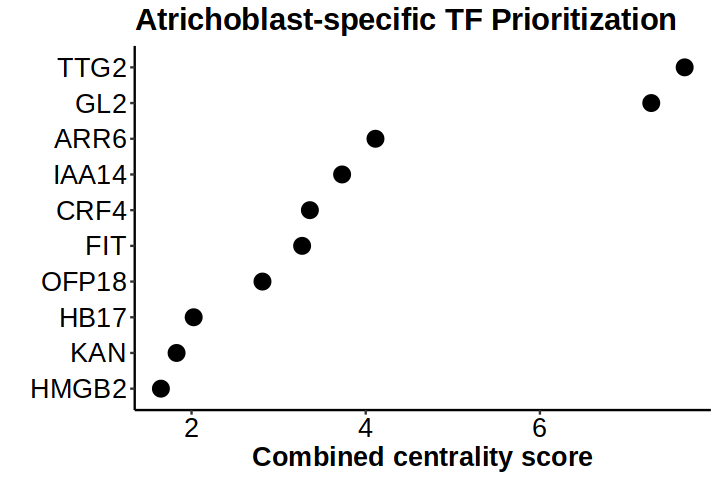

In [217]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(atri_rank[1:10,], aes(x=reorder(GeneName, atri, decreasing = FALSE),  y=atri)) + geom_point(size=4)+ 
  labs(title="Atrichoblast-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [61]:
write.csv(atri_rank,"Atrichoblast_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [172]:
tf_rank <- atri_rank %>% rownames(.)

In [173]:
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [174]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

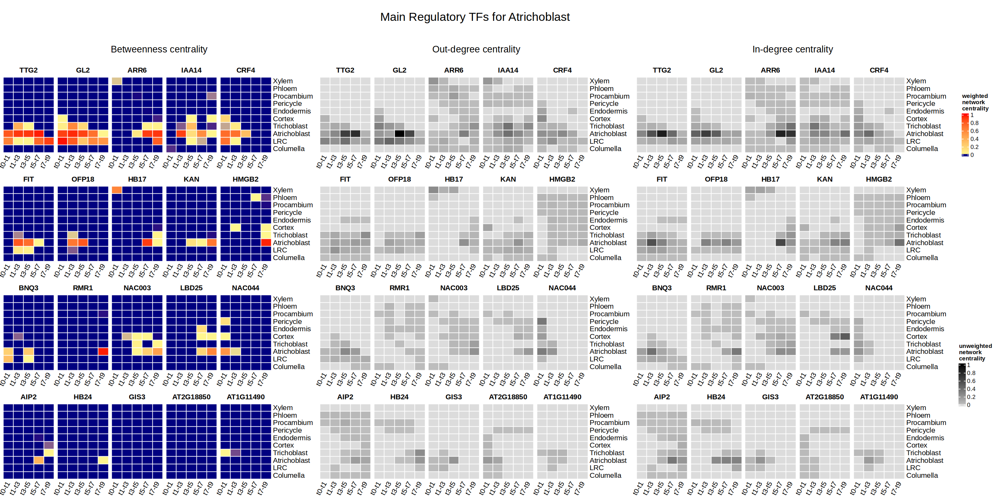

In [65]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Atrichoblast ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

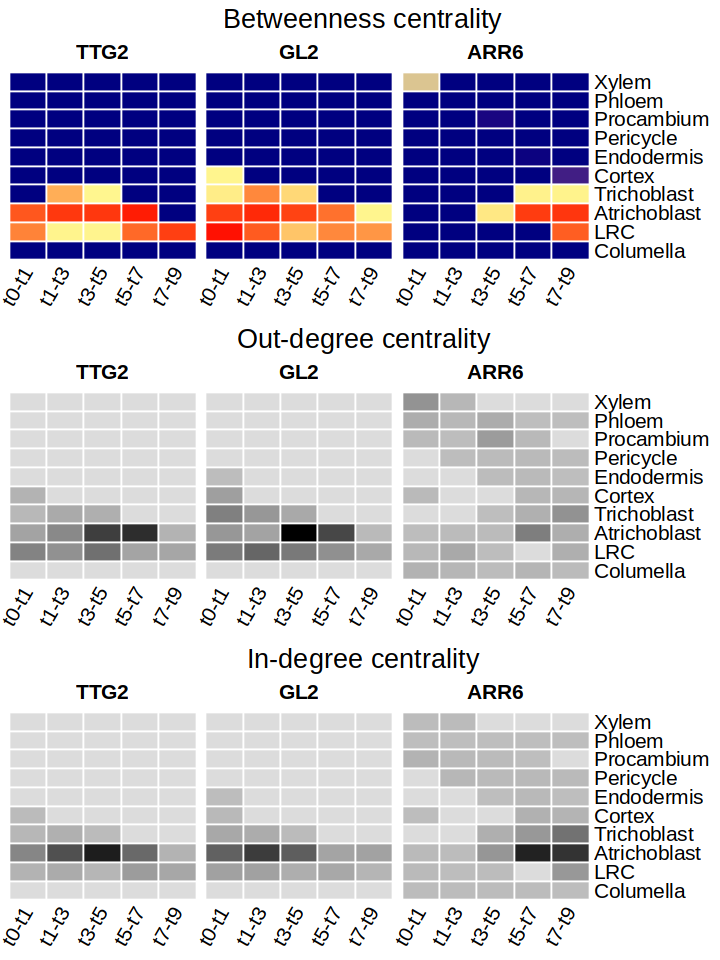

In [209]:
q1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3])
q2 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3])
q3 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3])

q1 <- grid.grabExpr(draw(q1))
q2 <- grid.grabExpr(draw(q2))
q3 <- grid.grabExpr(draw(q3))

options(repr.plot.width=6, repr.plot.height=8)
plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q1,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q2,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q3,nrow=2,rel_heights = c(1, 8)),nrow=3)

## Trichoblast

In [80]:
tri_rank <- bc_rank[which(bc_rank$tri*2 > bc_rank$all),]%>% arrange(desc(tri))
tri_rank$GeneName <- rownames(tri_rank)

In [81]:
tri_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AT3G53370,10.51332469,1.70510135,8.05305024,0.000000000,0.000000000,0.104263060,0.187801694,0.39737571,0.065732646,0.000000000,0.000000000,AT3G53370,AT3G53370
RHD6,11.22573826,3.85916008,7.36657818,0.000000000,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,AT1G66470,RHD6
WRKY65,8.65562962,1.38668348,4.36361919,0.011697506,0.197702082,0.000000000,0.000000000,0.00000000,0.000000000,1.613232755,1.082694618,AT1G29280,WRKY65
AT2G37120,6.29357775,0.93726369,3.76273932,0.104956333,0.177723679,0.101358153,0.007651672,0.80997145,0.192670974,0.199242466,0.000000000,AT2G37120,AT2G37120
tny,4.87767163,0.02922657,2.68223400,2.104674337,0.021349860,0.000000000,0.040186868,0.00000000,0.000000000,0.000000000,0.000000000,AT5G25810,tny
WRKY70,3.17128234,0.67219042,1.80645903,0.000000000,0.000000000,0.069130162,0.062103032,0.00000000,0.027210884,0.202466927,0.331721889,AT3G56400,WRKY70
AT4G39160,1.71652375,0.23754052,1.35605000,0.000000000,0.013519256,0.050989155,0.002159837,0.00000000,0.012332391,0.005735605,0.038196982,AT4G39160,AT4G39160
GL3,1.11211635,0.27241212,0.75079177,0.088912467,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,AT5G41315,GL3
RL6,0.65680222,0.05712800,0.55397474,0.000000000,0.000000000,0.000000000,0.000000000,0.00000000,0.015223153,0.030476328,0.000000000,AT1G75250,RL6


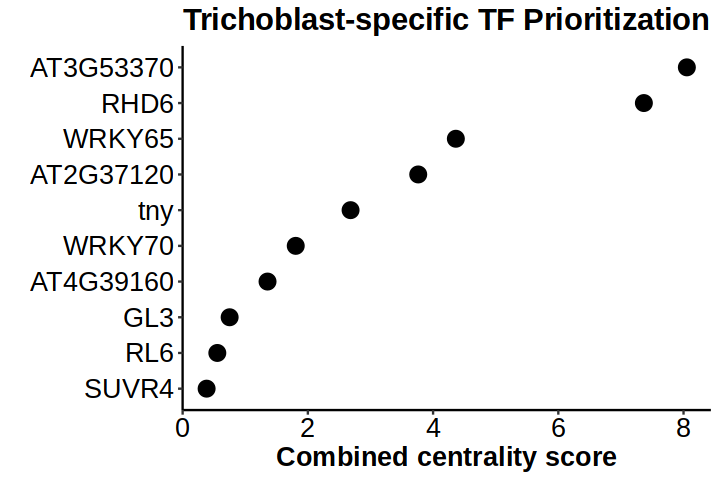

In [219]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(tri_rank[1:10,], aes(x=reorder(GeneName, tri, decreasing = FALSE),  y=tri)) + geom_point(size=4)+ 
  labs(title="Trichoblast-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [1245]:
write.csv(tri_rank,"Trichoblast_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [210]:
## Top20 only
tf_rank <- tri_rank %>% rownames(.)
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [1247]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

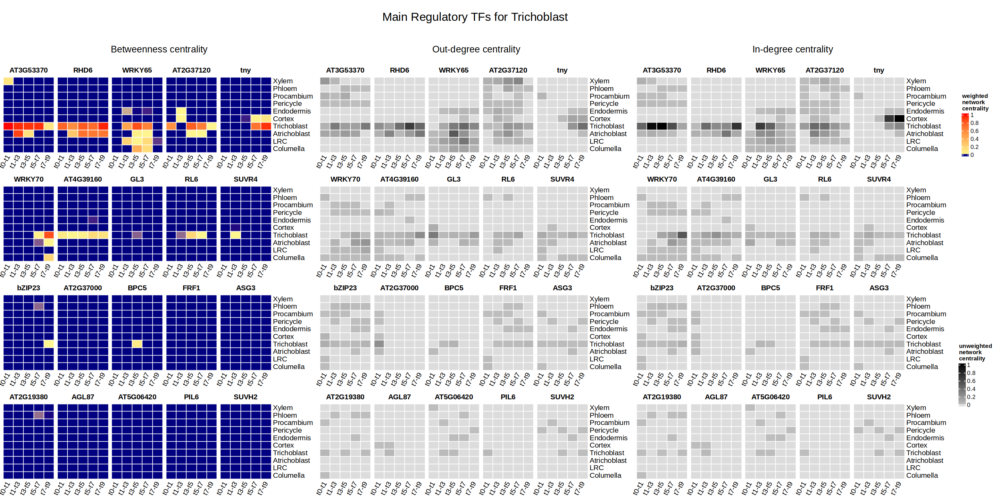

In [1248]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Trichoblast ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

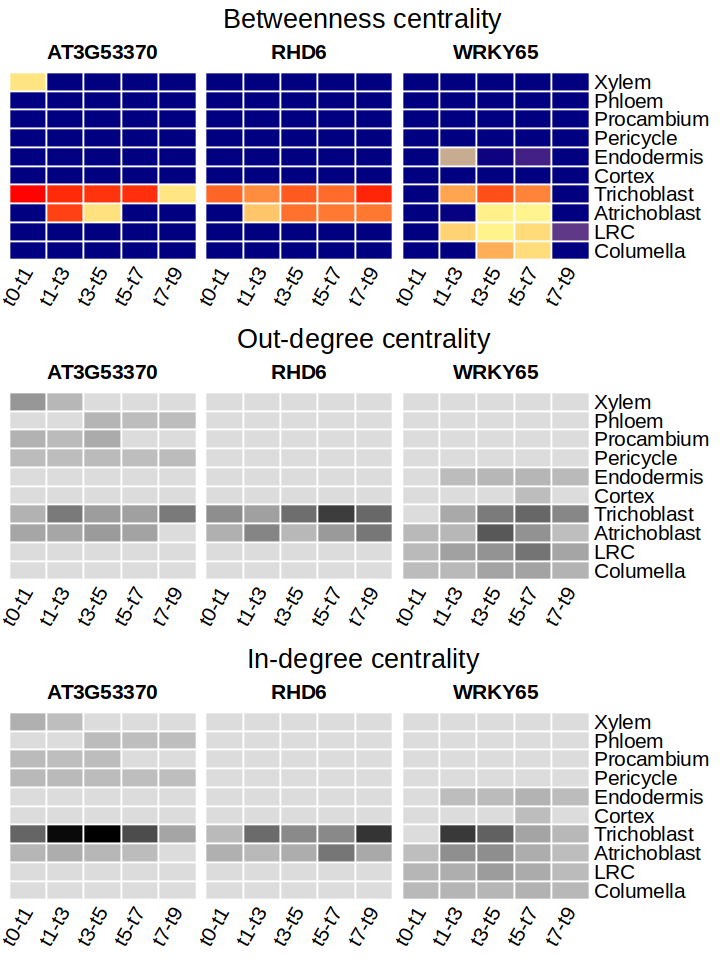

In [211]:
q1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3])
q2 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3])
q3 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3])

q1 <- grid.grabExpr(draw(q1))
q2 <- grid.grabExpr(draw(q2))
q3 <- grid.grabExpr(draw(q3))

options(repr.plot.width=6, repr.plot.height=8)
plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q1,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q2,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q3,nrow=2,rel_heights = c(1, 8)),nrow=3)

## Cortex

In [83]:
cor_rank <- bc_rank[which(bc_rank$cor*2 > bc_rank$all),]%>% arrange(desc(cor))
cor_rank$GeneName <- rownames(cor_rank)

In [84]:
cor_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
JKD,8.2396085,0.0000000,0.0000000,5.358894391,2.720061321,0.000000000,0.000000000,0,0.000000000,0.00000000,0.160652759,AT5G03150,JKD
AT1G05710,6.1268177,0.0000000,0.0000000,4.414423648,1.670630776,0.036239355,0.005523898,0,0.000000000,0.00000000,0.000000000,AT1G05710,AT1G05710
AT1G72210,4.3978702,0.0000000,0.0000000,3.326076849,0.910060583,0.002360119,0.000000000,0,0.000000000,0.00000000,0.159372610,AT1G72210,AT1G72210
AT2G38300,3.1103756,0.0000000,0.0000000,2.585956800,0.413422249,0.000000000,0.000000000,0,0.000000000,0.00000000,0.110996559,AT2G38300,AT2G38300
JAZ6,2.0371642,0.1452226,0.0678334,1.522800605,0.175564432,0.055974677,0.048367608,0,0.004556113,0.00000000,0.016844717,AT1G72450,JAZ6
IDD4,1.7400502,0.0000000,0.0000000,1.348173725,0.379331910,0.000000000,0.000000000,0,0.000000000,0.00000000,0.012544599,AT2G02080,IDD4
LRP1,2.2433905,0.0000000,0.0000000,1.347436802,0.264705777,0.315998738,0.275261648,0,0.000000000,0.00000000,0.039987577,AT5G12330,LRP1
AT2G42660,1.5349520,0.0000000,0.0000000,1.337205769,0.000000000,0.000000000,0.000000000,0,0.000000000,0.00000000,0.197746268,AT2G42660,AT2G42660
ERF15,1.8318405,0.0000000,0.0000000,0.930032857,0.897259103,0.000000000,0.000000000,0,0.000000000,0.00000000,0.004548579,AT2G31230,ERF15


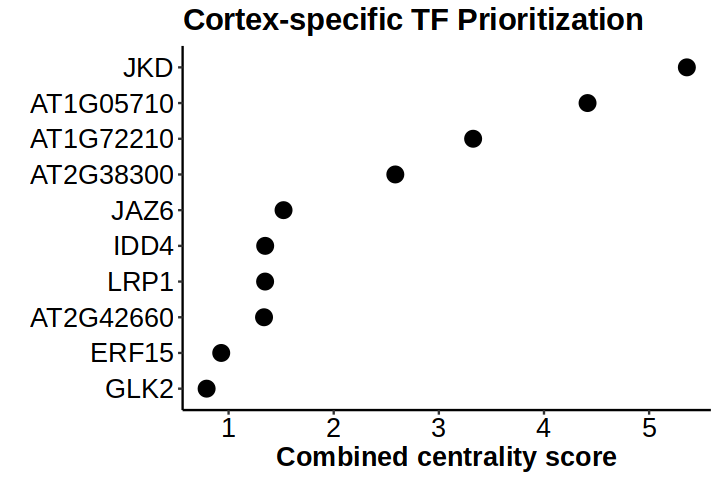

In [146]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(cor_rank[1:10,], aes(x=reorder(GeneName, cor, decreasing = FALSE),  y=cor)) + geom_point(size=4)+ 
  labs(title="Cortex-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [1251]:
write.csv(cor_rank,"Cortex_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [1252]:
tf_rank <- cor_rank %>% rownames(.)
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
#p4 <- plot_bc(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
#p8 <- plot_oc(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
#p12 <- plot_ic(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

In [1253]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
#p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
#p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
#p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

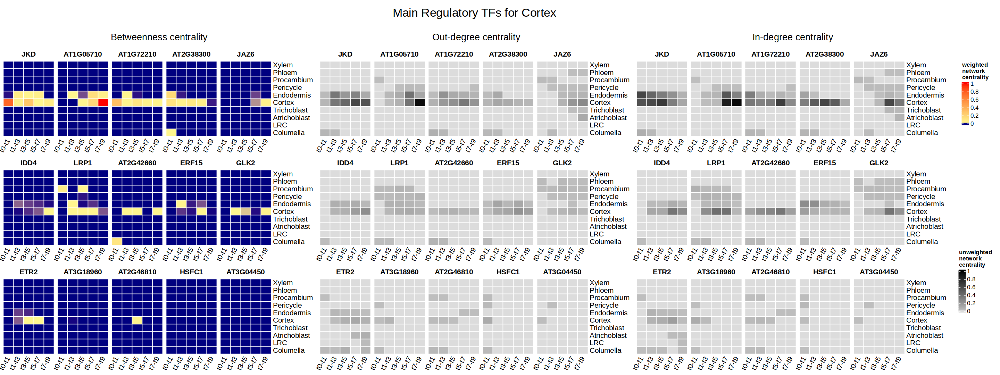

In [1254]:
options(repr.plot.width=24, repr.plot.height=9)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Cortex ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,nrow=3),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,nrow=3),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,nrow=3),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

In [212]:
## Top 10 only
tf_rank <- cor_rank %>% rownames(.)
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
#p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
#p4 <- plot_bc(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
#p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
#p8 <- plot_oc(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
#p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
#p12 <- plot_ic(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

In [164]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
#p3 <- grid.grabExpr(draw(p3))
#p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
#p7 <- grid.grabExpr(draw(p7))
#p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
#p11 <- grid.grabExpr(draw(p11))
#p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

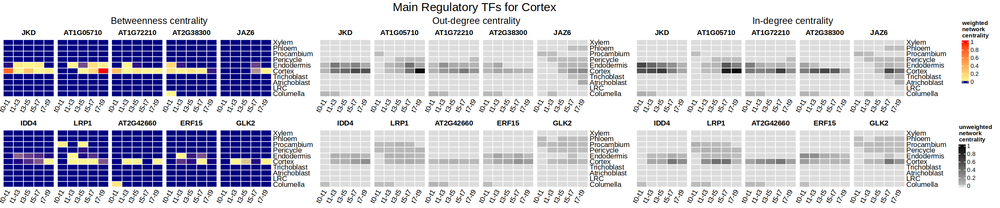

In [165]:
options(repr.plot.width=24, repr.plot.height=5)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Cortex ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,nrow=2),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,nrow=2),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,nrow=2),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

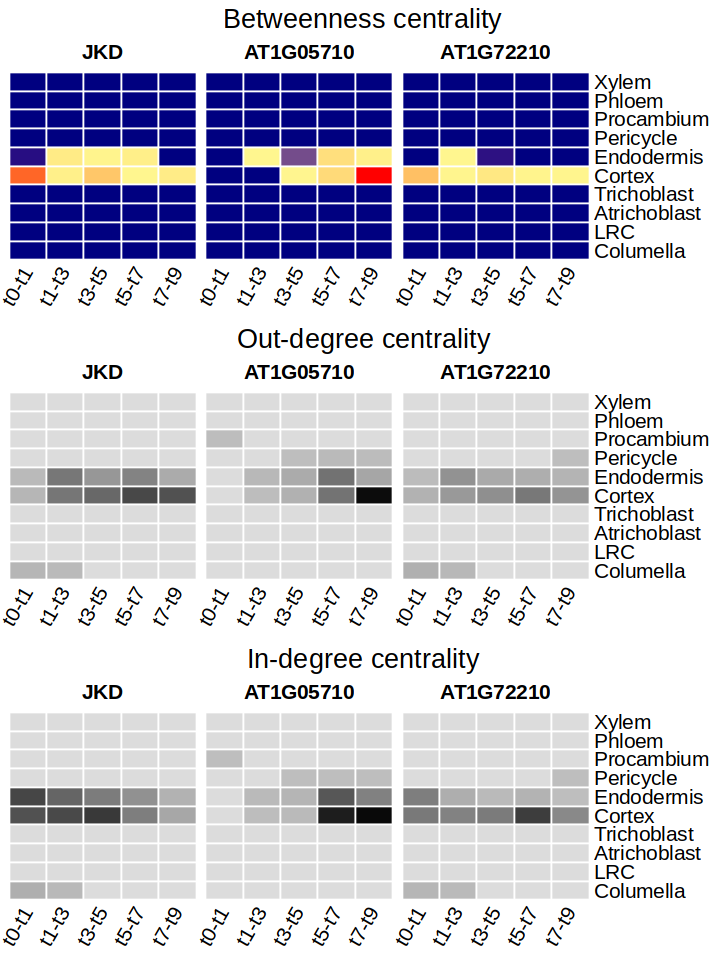

In [213]:
q1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3])
q2 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3])
q3 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3])

q1 <- grid.grabExpr(draw(q1))
q2 <- grid.grabExpr(draw(q2))
q3 <- grid.grabExpr(draw(q3))

options(repr.plot.width=6, repr.plot.height=8)
plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q1,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q2,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q3,nrow=2,rel_heights = c(1, 8)),nrow=3)

## Endodermis

In [88]:
end_rank <- bc_rank[which(bc_rank$end*2 > bc_rank$all),]%>% arrange(desc(end))
end_rank$GeneName <- rownames(end_rank)

In [89]:
end_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
MYB36,19.51309408,0.00000000,0.000000000,3.96557285,11.64822687,3.899294360,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,AT5G57620,MYB36
MYB74,10.57984718,0.00000000,0.000000000,1.79339769,7.04070607,1.432723885,0.006848401,0.30617114,0.000000000,0.000000000,0.000000000,AT4G05100,MYB74
MYB68,7.95738692,0.00000000,0.000000000,1.46239238,6.21188064,0.283113908,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,AT5G65790,MYB68
SOM,6.91590076,0.31147119,0.000000000,1.00295479,4.67445399,0.647166979,0.234669337,0.00000000,0.045184473,0.000000000,0.000000000,AT1G03790,SOM
RAX2,5.93069125,0.35644137,0.034200666,1.20469945,3.94113761,0.353927368,0.000000000,0.00000000,0.000000000,0.040284772,0.000000000,AT2G36890,RAX2
BLJ,4.39923249,0.00000000,0.000000000,0.56360296,3.60218449,0.233445030,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,AT1G14580,BLJ
SCR,4.82269115,0.00000000,0.000000000,1.82554739,2.99714375,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,AT3G54220,SCR
TLP11,4.12025319,0.00000000,0.306172801,0.05100626,2.52513167,0.398776753,0.424594941,0.00000000,0.414570765,0.000000000,0.000000000,AT5G18680,TLP11
bZIP58,1.71582983,0.00000000,0.000000000,0.00000000,1.57178222,0.070008903,0.074038708,0.00000000,0.000000000,0.000000000,0.000000000,AT1G13600,bZIP58


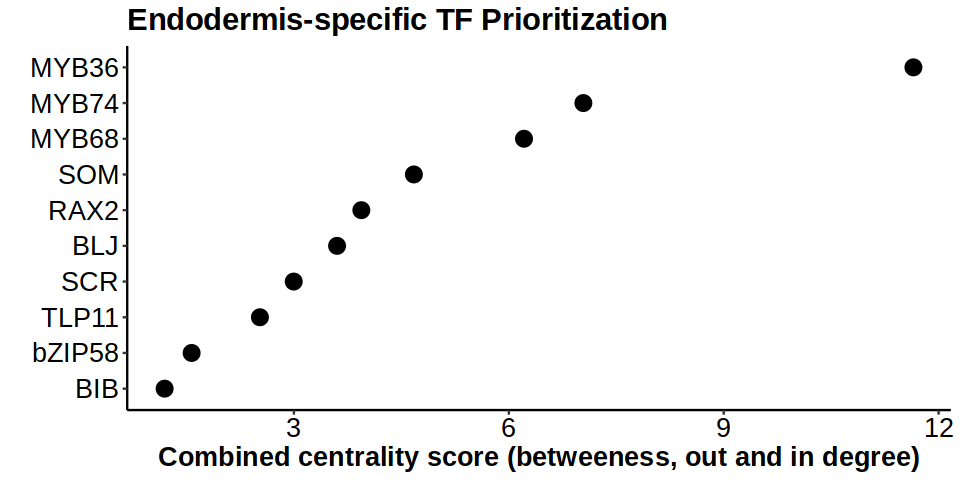

In [166]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(end_rank[1:10,], aes(x=reorder(GeneName, end, decreasing = FALSE),  y=end)) + geom_point(size=4)+ 
  labs(title="Endodermis-specific TF Prioritization",x="", y = "Combined centrality score (betweeness, out and in degree)")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [1257]:
write.csv(end_rank,"Endodermis_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [233]:
tf_rank <- end_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [1259]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

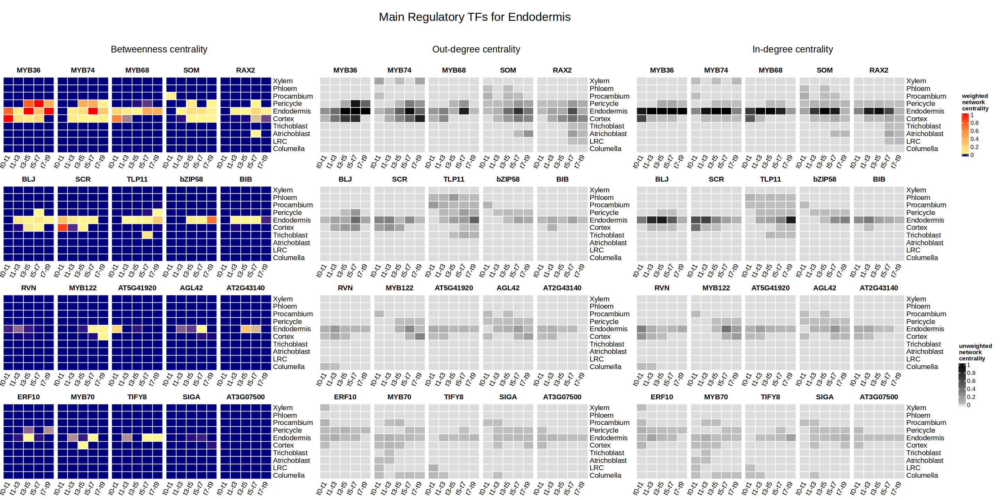

In [1260]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Endodermis ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

In [158]:
tf_rank <- end_rank %>% rownames(.)
# Max 10
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
#p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
#p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
#p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
#p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
#p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
#p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [159]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
#p3 <- grid.grabExpr(draw(p3))
#p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
#p7 <- grid.grabExpr(draw(p7))
#p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
#p11 <- grid.grabExpr(draw(p11))
#p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

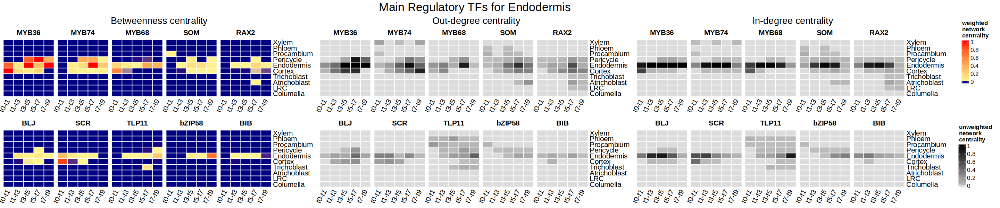

In [162]:
options(repr.plot.width=24, repr.plot.height=5)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Endodermis ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,nrow=2),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,nrow=2),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,nrow=2),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

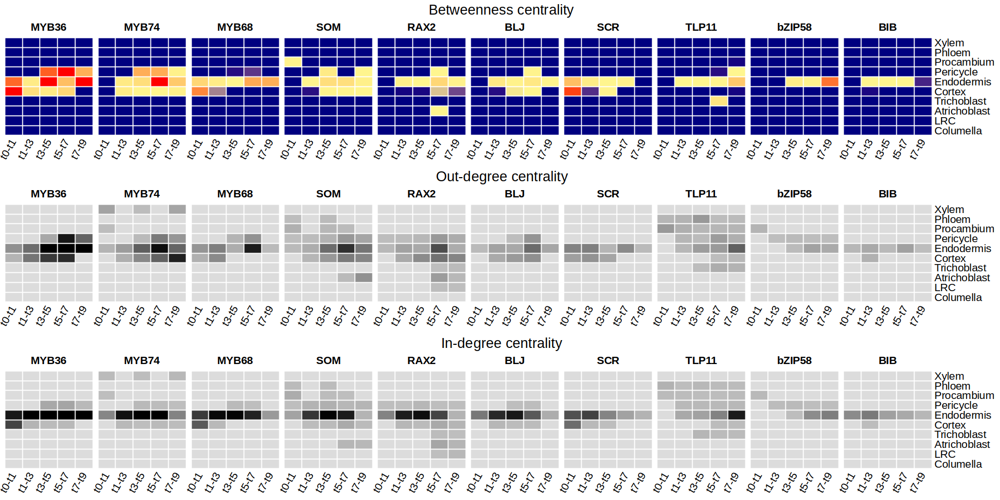

In [234]:
q1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5]) + plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10]) 
q2 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5]) + plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10]) 
q3 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5]) + plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10]) 

q1 <- grid.grabExpr(draw(q1))
q2 <- grid.grabExpr(draw(q2))
q3 <- grid.grabExpr(draw(q3))

options(repr.plot.width=16, repr.plot.height=8)
plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q1,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q2,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q3,nrow=2,rel_heights = c(1, 8)),nrow=3)

## Pericycle

In [92]:
per_rank <- bc_rank[which(bc_rank$per*2 > bc_rank$all),]%>% arrange(desc(per))
per_rank$GeneName <- rownames(per_rank)

In [93]:
per_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
MYBC1,13.63866508,0.00000000,0.00000000,0.45338769,2.143205062,9.00661080,1.794287688,0.00000000,0.24117383,0.000000000,0.000000000,AT2G40970,MYBC1
LBD16,7.82135600,0.00000000,0.00000000,0.11658626,0.174778877,4.15706614,3.073922149,0.00000000,0.29900256,0.000000000,0.000000000,AT2G42430,LBD16
LBD14,4.16771007,0.00000000,0.00000000,0.05761273,0.036996037,3.83815074,0.234950563,0.00000000,0.00000000,0.000000000,0.000000000,AT2G31310,LBD14
SAP,4.26388507,0.13255543,0.00000000,0.24218919,0.160135518,3.62269558,0.106309359,0.00000000,0.00000000,0.000000000,0.000000000,AT5G35770,SAP
NUC,5.55906804,0.00000000,0.00000000,0.47189966,0.000000000,3.61382214,0.649976803,0.00000000,0.81993876,0.000000000,0.003430678,AT5G44160,NUC
AT3G21330,5.65980461,0.16912726,0.00000000,0.55388195,0.565696008,3.42748431,0.943615086,0.00000000,0.00000000,0.000000000,0.000000000,AT3G21330,AT3G21330
IDD11,4.27563103,0.00000000,0.00000000,0.00000000,0.000000000,3.28891496,0.986716077,0.00000000,0.00000000,0.000000000,0.000000000,AT3G13810,IDD11
MGP,4.46285753,0.00000000,0.00000000,0.74208303,0.133264999,3.05244123,0.535068272,0.00000000,0.00000000,0.000000000,0.000000000,AT1G03840,MGP
AT2G14880,3.66710161,0.54757196,0.01751162,0.12005362,0.305700697,2.38140484,0.272684904,0.00000000,0.00000000,0.022173961,0.000000000,AT2G14880,AT2G14880


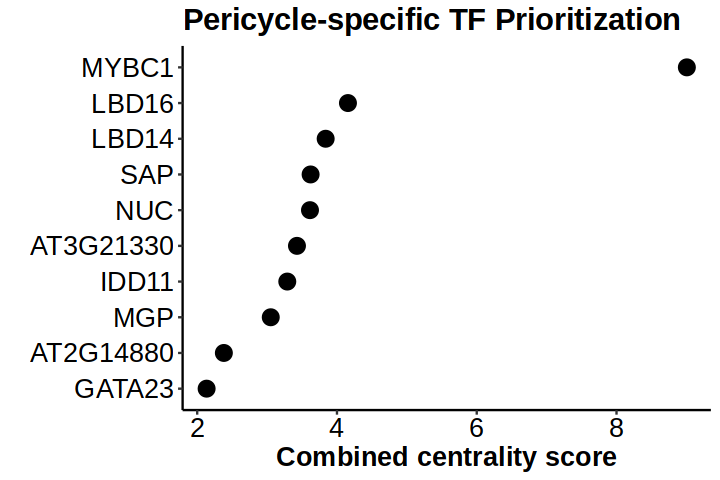

In [222]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(per_rank[1:10,], aes(x=reorder(GeneName, per, decreasing = FALSE),  y=per)) + geom_point(size=4)+ 
  labs(title="Pericycle-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [1263]:
write.csv(per_rank,"Pericycle_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [214]:
tf_rank <- per_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [1265]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

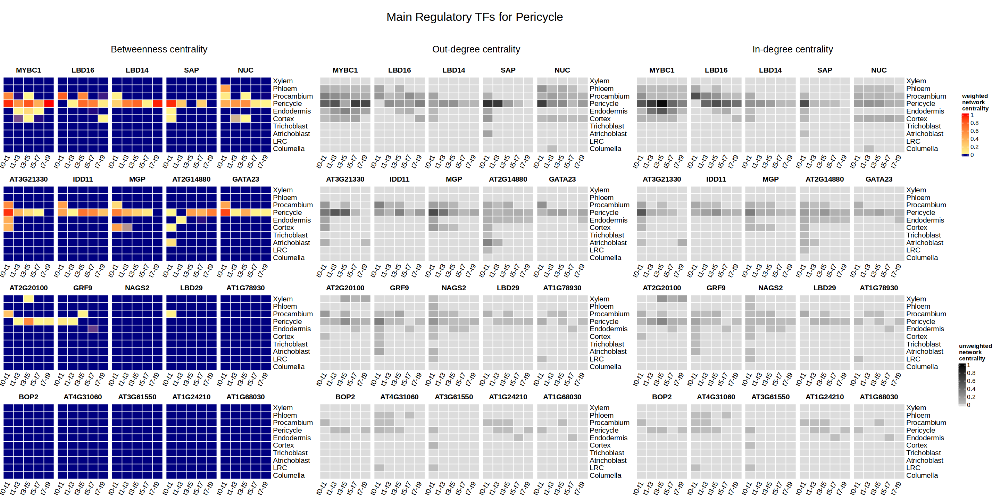

In [1266]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Pericycle ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

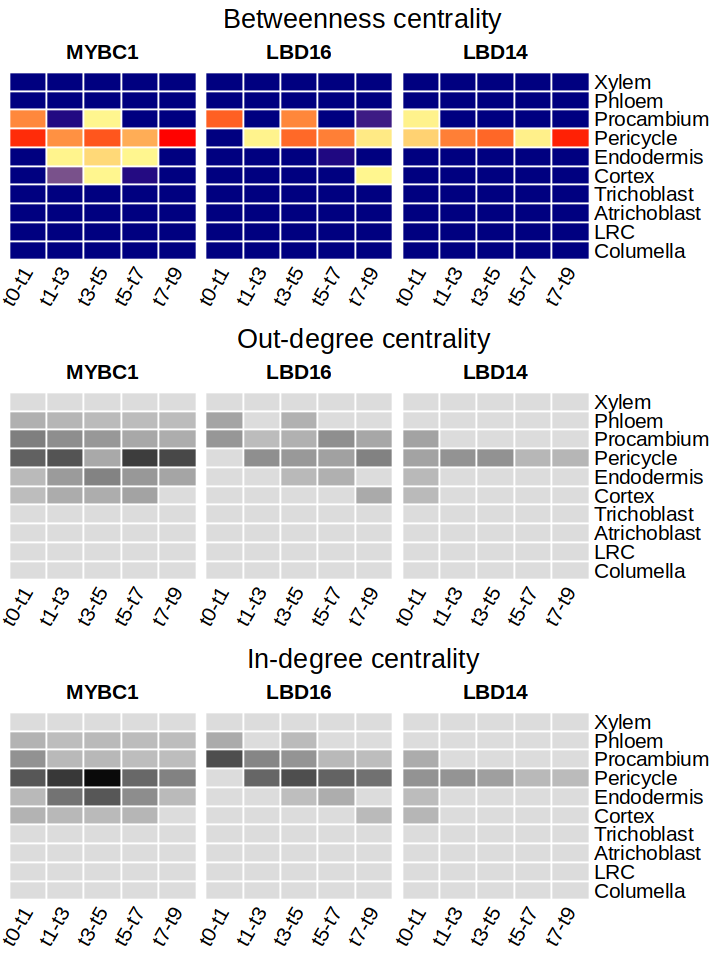

In [215]:
q1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3])
q2 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3])
q3 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3])

q1 <- grid.grabExpr(draw(q1))
q2 <- grid.grabExpr(draw(q2))
q3 <- grid.grabExpr(draw(q3))

options(repr.plot.width=6, repr.plot.height=8)
plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q1,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q2,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q3,nrow=2,rel_heights = c(1, 8)),nrow=3)

## Procambium

In [96]:
pro_rank <- bc_rank[which(bc_rank$pro*2 > bc_rank$all),]%>% arrange(desc(pro))
pro_rank$GeneName <- rownames(pro_rank)

In [97]:
pro_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
IAA28,13.7612975,0.1894170,0.073915073,0.532529533,0.318490933,0.71275472,7.06383265,0.8391969,4.031160765,0.000000000,0.000000000,AT5G25890,IAA28
ABO3,11.6856561,0.2128955,0.009809774,0.029197080,0.111201150,4.32810648,6.13141112,0.1753614,0.687673543,0.000000000,0.000000000,AT1G66600,ABO3
IDD14,6.2086688,0.0000000,0.000000000,0.000000000,0.070188675,1.55017977,3.11049066,0.3265915,1.151218201,0.000000000,0.000000000,AT1G68130,IDD14
HAT9,5.5698182,0.0000000,0.020664199,0.025932810,0.011483254,2.26225702,3.01849618,0.0000000,0.230984762,0.000000000,0.000000000,AT2G22800,HAT9
ERF12,4.6778600,0.0000000,0.000000000,0.000000000,0.015311005,1.64645212,2.54169873,0.0000000,0.474398163,0.000000000,0.000000000,AT1G28360,ERF12
AT1G75490,2.1074593,0.0000000,0.000000000,0.000000000,0.000000000,0.13661200,1.66707941,0.0000000,0.303767886,0.000000000,0.000000000,AT1G75490,AT1G75490
HB18,1.8519702,0.0000000,0.000000000,0.000000000,0.004784689,0.18242039,1.47025793,0.0000000,0.194507235,0.000000000,0.000000000,AT1G70920,HB18
AT2G40200,2.0720869,0.0000000,0.000000000,0.005375774,0.000000000,0.23731271,1.42836811,0.0000000,0.401030320,0.000000000,0.000000000,AT2G40200,AT2G40200
NAC080,1.8683555,0.0000000,0.000000000,0.000000000,0.006698565,0.33656391,1.23911258,0.0000000,0.270348053,0.008422647,0.007209796,AT5G07680,NAC080


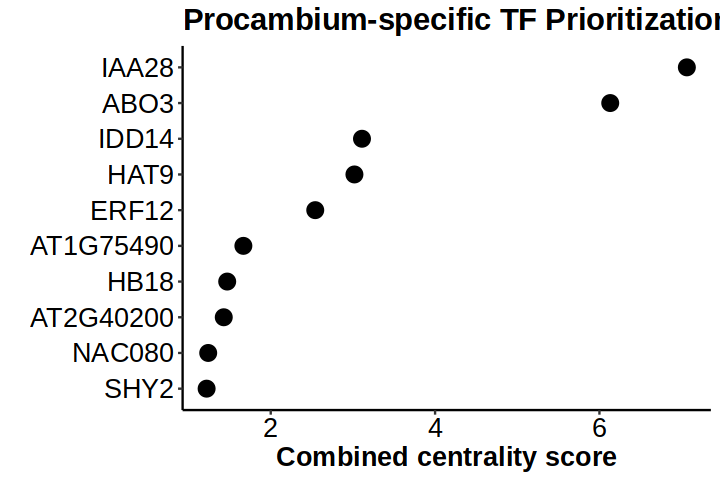

In [223]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(pro_rank[1:10,], aes(x=reorder(GeneName, pro, decreasing = FALSE),  y=pro)) + geom_point(size=4)+ 
  labs(title="Procambium-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [1269]:
write.csv(pro_rank,"Procambium_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [1270]:
tf_rank <- pro_rank %>% rownames(.)
# Max 30
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_blank(tf_rank[15])

p4 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p5 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p6 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_blank(tf_rank[15])

p7 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p8 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p9 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_blank(tf_rank[15])

In [1271]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

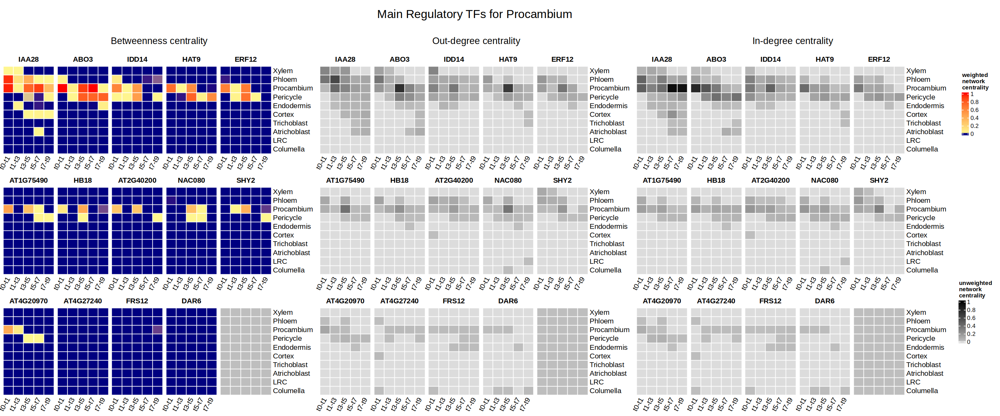

In [1272]:
options(repr.plot.width=24, repr.plot.height=10)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Procambium ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,nrow=3),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p4,p5,p6,nrow=3),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p7,p8,p9,nrow=3),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Phloem

In [99]:
phl_rank <- bc_rank[which(bc_rank$phl*2 > bc_rank$all),]%>% arrange(desc(phl))
phl_rank$GeneName <- rownames(phl_rank)

In [100]:
phl_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
APL,18.6229618,0.00000000,0.000000000,0.00000000,0.000000000,1.265907639,2.495922354,1.641531332,13.21960051,0.000000000,0.000000000,AT1G79430,APL
OBP2,19.5573254,0.00000000,0.000000000,0.00000000,0.000000000,3.989014385,4.430147678,0.000000000,11.13816336,0.000000000,0.000000000,AT1G07640,OBP2
AT3G12730,10.4310407,0.00000000,0.000000000,0.00000000,0.000000000,0.929487640,0.211938642,0.000000000,9.28961440,0.000000000,0.000000000,AT3G12730,AT3G12730
DAR2,10.5373864,0.00000000,0.000000000,0.00000000,0.000000000,0.202522452,1.263778973,0.465563161,8.60552182,0.000000000,0.000000000,AT2G39830,DAR2
AT2G03500,9.9853427,0.00000000,0.000000000,0.00000000,0.000000000,0.766498483,0.437397254,0.235024550,8.54642243,0.000000000,0.000000000,AT2G03500,AT2G03500
DOF6,11.3168709,0.00000000,0.000000000,0.00000000,0.000000000,0.581244409,0.354212657,2.053785270,8.32762854,0.000000000,0.000000000,AT3G45610,DOF6
NAC057,7.2796075,0.00000000,0.000000000,0.00000000,0.000000000,0.050659720,0.163432843,0.520738836,6.54477611,0.000000000,0.000000000,AT3G17730,NAC057
HCA2,7.1364223,0.00000000,0.000000000,0.00000000,0.000000000,0.141976234,0.138924581,0.482277297,6.37324420,0.000000000,0.000000000,AT5G62940,HCA2
AT2G44940,9.1179088,0.00000000,0.000000000,0.00000000,0.060890108,1.202172996,1.547308685,0.000000000,6.30753700,0.000000000,0.000000000,AT2G44940,AT2G44940


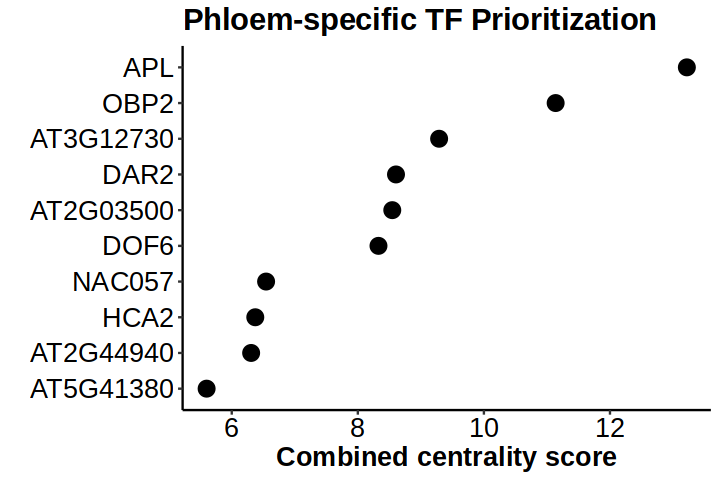

In [224]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(phl_rank[1:10,], aes(x=reorder(GeneName, phl, decreasing = FALSE),  y=phl)) + geom_point(size=4)+ 
  labs(title="Phloem-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [1275]:
write.csv(phl_rank,"Phloem_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [1276]:
tf_rank <- phl_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [1277]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

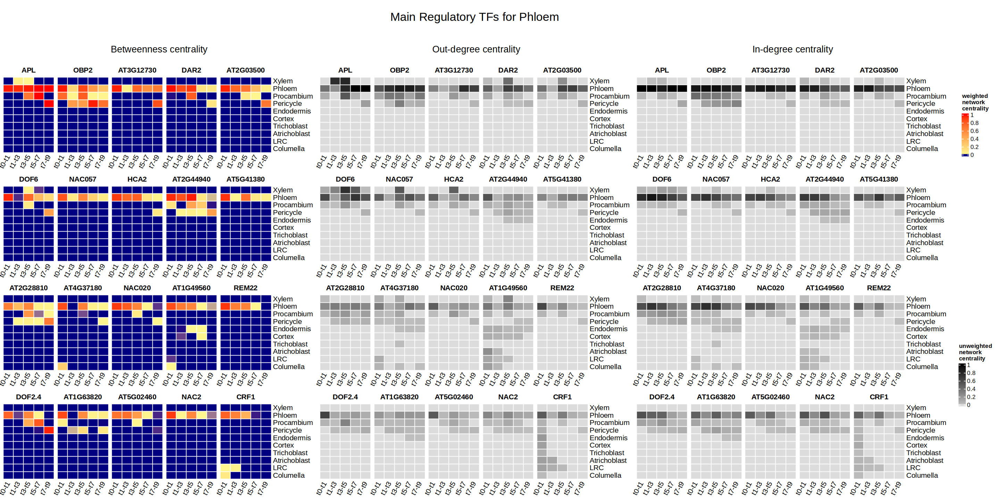

In [1278]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Phloem ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Xylem

In [103]:
xyl_rank <- bc_rank[which(bc_rank$xyl*2 > bc_rank$all),]%>% arrange(desc(xyl))
xyl_rank$GeneName <- rownames(xyl_rank)

In [104]:
xyl_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AT1G68810,15.740776,0.00000000,1.24410788,0.00000000,0.000000000,0.006039273,0.100109511,12.388537,2.00198178,0.000000000,0.00000000,AT1G68810,AT1G68810
MYB46,10.975484,0.00000000,0.00000000,0.00000000,0.000000000,0.000000000,0.000000000,10.975484,0.00000000,0.000000000,0.00000000,AT5G12870,MYB46
VND2,12.618169,0.00000000,1.12948393,0.00000000,0.000000000,0.000000000,0.006818368,10.346859,1.13500836,0.000000000,0.00000000,AT4G36160,VND2
ATHB-15,15.439924,0.00000000,0.00000000,0.00000000,0.000000000,0.318966129,3.657313301,9.677060,1.78658486,0.000000000,0.00000000,AT1G52150,ATHB-15
DOF2,13.224178,0.00000000,1.36575019,0.20072993,1.487350226,0.000000000,0.002870999,9.492840,0.59625901,0.017206816,0.06117147,AT3G21270,DOF2
MYB83,9.307381,0.00000000,0.00000000,0.00000000,0.000000000,0.000000000,0.000000000,9.307381,0.00000000,0.000000000,0.00000000,AT3G08500,MYB83
VND7,9.284049,0.00000000,0.00000000,0.00000000,0.000000000,0.000000000,0.000000000,9.284049,0.00000000,0.000000000,0.00000000,AT1G71930,VND7
AT1G66810,10.071416,0.17251857,0.52012453,0.00000000,0.000000000,0.000000000,0.000000000,9.281125,0.00000000,0.097647795,0.00000000,AT1G66810,AT1G66810
IAA6,9.310356,0.00000000,0.00000000,0.00000000,0.000000000,0.000000000,0.000000000,9.218519,0.09183673,0.000000000,0.00000000,AT1G52830,IAA6


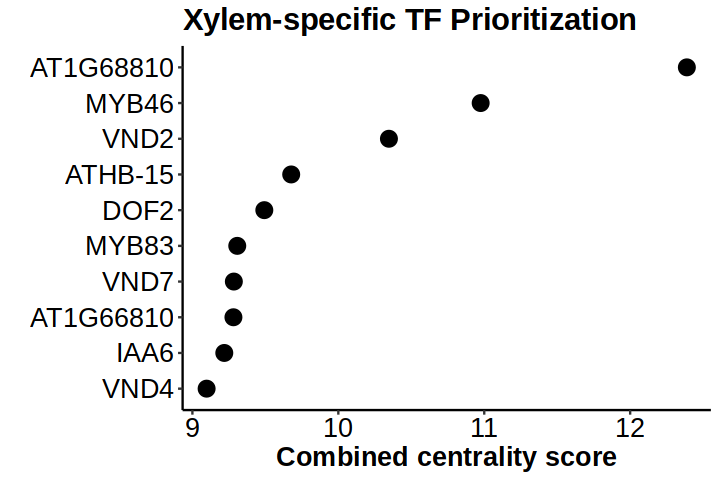

In [225]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(xyl_rank[1:10,], aes(x=reorder(GeneName, xyl, decreasing = FALSE),  y=xyl)) + geom_point(size=4)+ 
  labs(title="Xylem-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [1281]:
write.csv(xyl_rank,"Xylem_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [1282]:
tf_rank <- xyl_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [1283]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

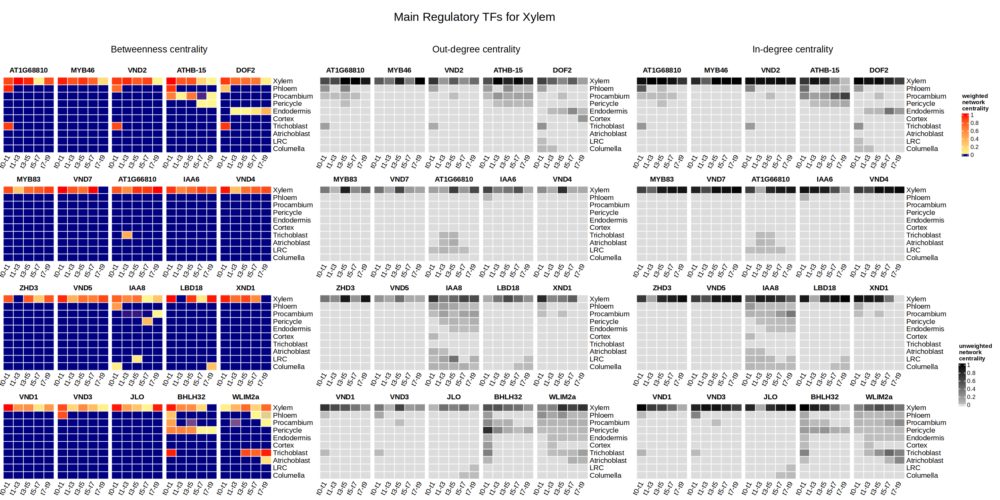

In [1284]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Xylem ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## LRC

In [109]:
lrc_rank <- bc_rank[which(bc_rank$lrc*2 > bc_rank$all),]%>% arrange(desc(lrc))
lrc_rank$GeneName <- rownames(lrc_rank)

In [1286]:
lrc_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
WRKY9,14.59444184,4.26077798,1.584302664,0.00000000,0.000000000,0.000000000,0.000000000,0.0000000,0.000000000,7.94390354,0.80545766,AT1G68150
ARF16,13.02068521,2.30930704,0.282169631,1.17619173,0.062867295,0.000000000,0.000000000,0.0000000,0.000000000,6.66173619,2.52841331,AT4G30080
IAA1,8.42649079,1.57459699,0.158407992,0.91438152,0.000000000,0.000000000,0.000000000,0.0000000,0.000000000,4.91253603,0.86656826,AT4G14560
AIL5,6.18681707,0.34670087,0.000000000,0.16137931,0.000000000,0.003858615,0.016628469,0.0000000,0.000000000,4.49512079,1.16312903,AT5G57390
ANL2,7.72406933,1.81627086,0.678029016,0.83919527,0.081317480,0.000000000,0.000000000,0.0000000,0.000000000,3.91301596,0.39624074,AT4G00730
AT1G74840,7.03802367,0.79216261,0.262263253,0.47640862,0.379859229,0.103724502,0.078108719,0.4127525,0.015306122,3.81472680,0.70271129,AT1G74840
AT2G35910,5.89403877,0.25140897,0.086950316,0.00000000,0.000000000,0.000000000,0.000000000,0.0000000,0.000000000,3.04980461,2.50587487,AT2G35910
AT1G05805,5.62101306,0.73134990,0.147438623,0.08463056,0.000000000,0.000000000,0.000000000,0.0000000,0.000000000,2.89665376,1.76094022,AT1G05805
LBD4,4.28618263,0.57698722,0.000000000,0.32905393,0.059190925,0.007766728,0.000000000,0.0000000,0.083912430,2.85794378,0.37132761,AT1G31320


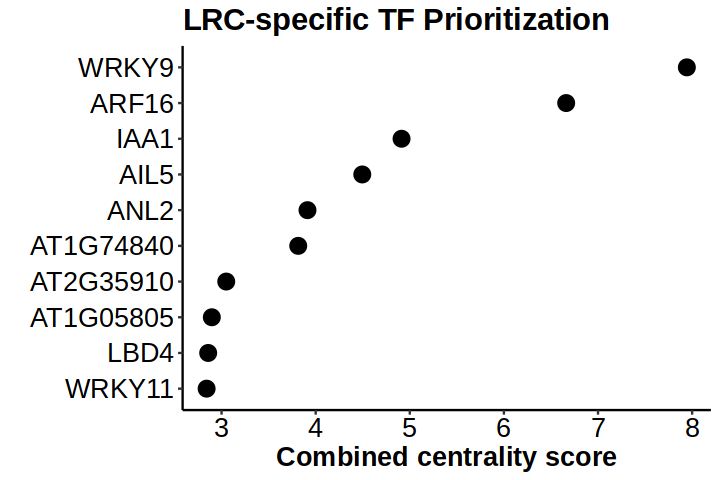

In [227]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(lrc_rank[1:10,], aes(x=reorder(GeneName, lrc, decreasing = FALSE),  y=lrc)) + geom_point(size=4)+ 
  labs(title="LRC-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [1287]:
write.csv(lrc_rank,"LRC_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [1288]:
tf_rank <- lrc_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [1289]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

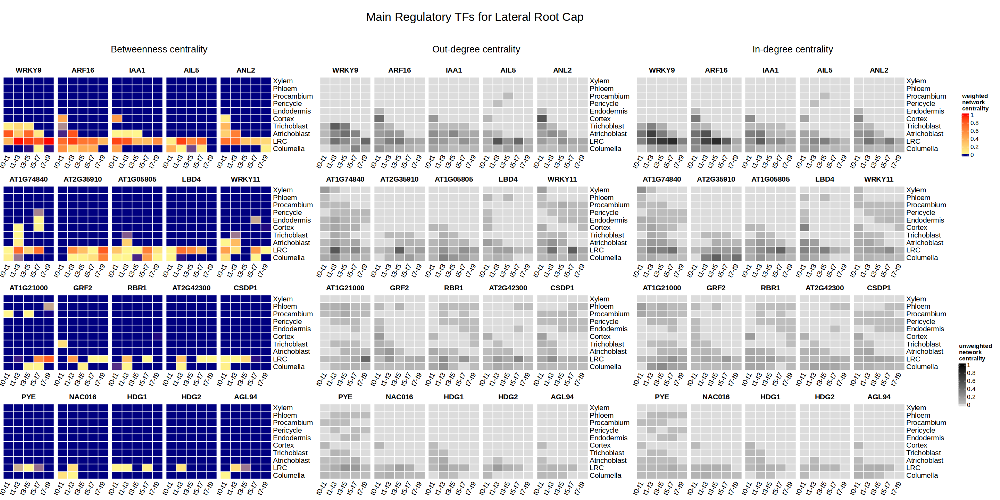

In [1290]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Lateral Root Cap ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Columella

In [111]:
col_rank <- bc_rank[which(bc_rank$col*2 > bc_rank$all),]%>% arrange(desc(col))
col_rank$GeneName <- rownames(col_rank)

In [112]:
col_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
FBH4,9.21690577,0.08544729,0.015616942,0.311309772,0.041168776,0.000000000,0.000000000,0.00000000,0.000000000,3.082557208,5.68080579,AT2G42280,FBH4
LBD41,10.15628931,0.37963773,0.154816921,0.000000000,0.056226204,0.034139350,0.102615142,0.00000000,0.000000000,4.249628884,5.17922508,AT3G02550,LBD41
WRKY26,6.08956508,0.16351024,0.009279390,0.000000000,0.000000000,0.154740276,0.215891510,0.00000000,0.000000000,1.647842854,3.89830081,AT5G07100,WRKY26
WRKY33,6.83291024,0.46618916,0.205871271,0.553852838,0.294000502,0.031296264,0.041761170,0.00000000,0.000000000,1.771403980,3.46853505,AT2G38470,WRKY33
RAP2.4,6.43730169,0.22312443,0.033721735,0.213625266,0.153915889,0.127748431,0.169710654,0.31480704,0.142573262,1.730703534,3.32737144,AT1G78080,RAP2.4
AT3G57800,6.08336328,0.18974626,0.000000000,0.000000000,0.000000000,0.074188410,0.125972115,0.00000000,0.407182871,2.099200100,3.18707352,AT3G57800,AT3G57800
NAM,3.79313739,0.02291742,0.000000000,0.112133792,0.017548508,0.000000000,0.026557424,0.00000000,0.000000000,0.451476499,3.16250375,AT1G52880,NAM
AT1G76580,5.84721261,0.19579291,0.003426918,0.036145004,0.015863019,0.002283867,0.002159837,0.00000000,0.010421124,2.548629052,3.03249087,AT1G76580,AT1G76580
RAP2.1,5.77680396,0.03234374,0.000000000,0.556970110,0.008936067,0.004570844,0.017023461,1.24396318,0.000000000,0.881365198,3.03163136,AT1G46768,RAP2.1


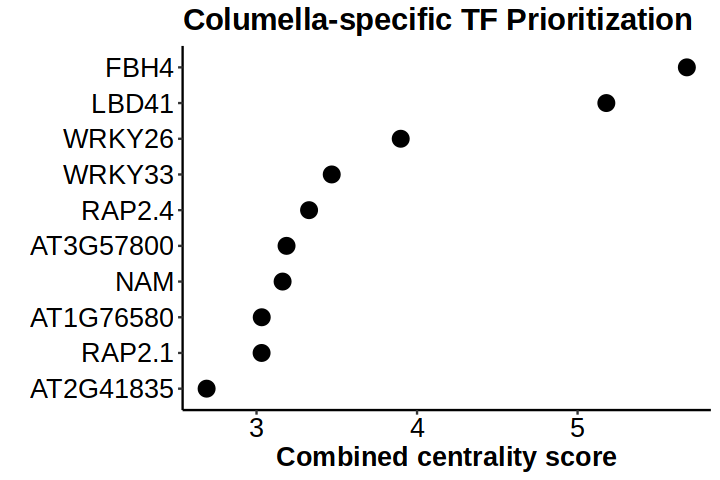

In [228]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(col_rank[1:10,], aes(x=reorder(GeneName, col, decreasing = FALSE),  y=col)) + geom_point(size=4)+ 
  labs(title="Columella-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [1293]:
write.csv(col_rank,"Columella_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [1294]:
tf_rank <- col_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [1295]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

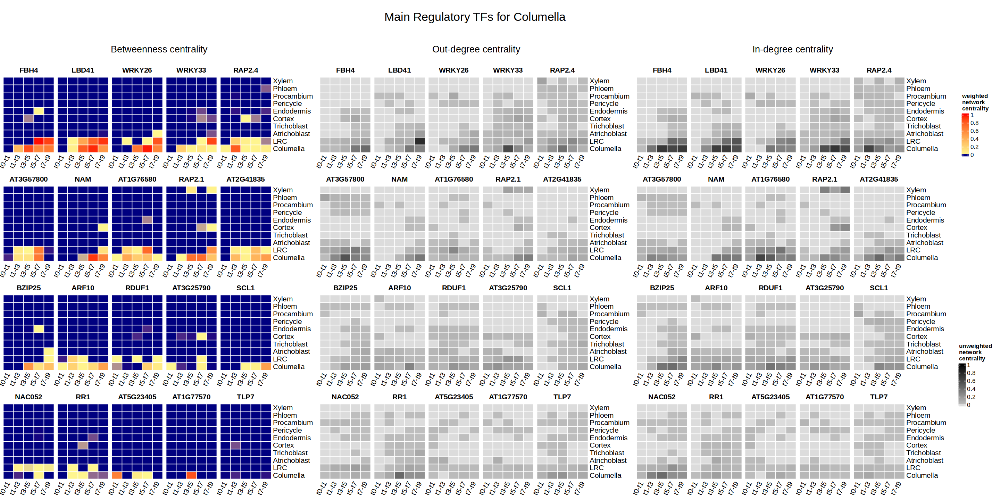

In [1296]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Columella ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Add tissue level

In [116]:
bc_rank <- bc_rank %>% mutate(ground=cor+end, epi=atri+tri, stele=per+pro+xyl+phl, epilrc=atri+tri+lrc, rc=lrc+col)

In [117]:
head(bc_rank)

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
BZIP9,31.71447,0.000000,0.000000,0.000000000,0.006698565,8.04635576,11.94430365,0.03622764,11.6808854,0.000000,0.000000,AT5G24800,0.006698565,0.000000,31.70777241,0.00000,0.00000
AT3G43430,29.50134,0.000000,0.000000,0.005375774,0.006698565,8.92414305,10.03369110,3.50786160,7.0235724,0.000000,0.000000,AT3G43430,0.012074338,0.000000,29.48926813,0.00000,0.00000
HAT7,32.32415,7.054065,5.626399,8.996598123,4.910315271,0.02122024,0.00000000,0.00000000,0.0000000,4.433060,1.282490,AT5G15150,13.906913394,12.680464,0.02122024,17.11352,5.71555
PLT1,22.94342,3.573806,0.000000,2.592117793,1.958605076,0.00000000,0.00000000,0.00000000,0.0000000,9.283443,5.535445,AT3G20840,4.550722869,3.573806,0.00000000,12.85725,14.81889
MYB36,19.51309,0.000000,0.000000,3.965572845,11.648226873,3.89929436,0.00000000,0.00000000,0.0000000,0.000000,0.000000,AT5G57620,15.613799719,0.000000,3.89929436,0.00000,0.00000
GATA2,30.67747,7.853413,5.533161,2.445113736,1.382593066,0.50181676,0.08967606,0.05936252,0.4627788,10.404863,1.944695,AT2G45050,3.827706802,13.386574,1.11363412,23.79144,12.34956


## Ground Tissue

In [118]:
ground_rank <- bc_rank[which(bc_rank$ground*2 > bc_rank$all),]%>% arrange(desc(ground))
ground_rank <- ground_rank[-c(match(rownames(cor_rank), rownames(ground_rank)),match(rownames(end_rank), rownames(ground_rank))),]
ground_rank$GeneName <- rownames(ground_rank)

In [119]:
ground_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
MYB12,24.9903130,0.24110551,0.155912849,10.11052553,5.93936241,1.060157731,1.112878224,4.32086271,1.413089539,0.019414381,0.617004128,AT2G47460,16.04988794,0.39701836,7.90698820,0.416432743,0.636418509,MYB12
MYB3,13.9699937,0.60984641,0.022671060,3.85248356,6.57827101,1.638384163,0.167072786,0.70609703,0.132993197,0.201219738,0.060954763,AT1G22640,10.43075457,0.63251747,2.64454718,0.833737212,0.262174501,MYB3
ARR3,11.3866183,0.31216200,0.052917778,4.72919423,3.40853435,0.619778245,0.725112144,0.00000000,0.624981197,0.241675809,0.672262527,AT1G59940,8.13772857,0.36507978,1.96987159,0.606755587,0.913938336,ARR3
AN3,9.2949905,0.76003007,0.067984101,2.89514322,3.03261764,2.092481149,0.087673905,0.00000000,0.050983200,0.215306608,0.092770587,AT5G28640,5.92776086,0.82801417,2.23113825,1.043320778,0.308077196,AN3
AtHB23,9.3641950,0.56403507,0.266474042,3.30633079,1.68667744,1.367882112,1.109416779,0.17487407,0.743953144,0.063654104,0.080897453,AT1G26960,4.99300823,0.83050911,3.39612610,0.894163215,0.144551557,AtHB23
GATA16,8.8033220,0.16763151,0.000000000,3.04103843,1.81470603,1.924130832,0.247701641,0.54901066,0.041496599,0.251383147,0.766223174,AT5G49300,4.85574446,0.16763151,2.76233974,0.419014658,1.017606321,GATA16
ULT1,7.4525749,0.28099737,0.000000000,2.55419627,2.08284711,1.310984580,0.164780230,0.10545857,0.015100330,0.325720857,0.612489631,AT4G28190,4.63704338,0.28099737,1.59632371,0.606718228,0.938210488,ULT1
HSFB4,5.0981755,0.10342921,0.000000000,2.13965901,2.15503629,0.357389408,0.174115559,0.00000000,0.145918367,0.000000000,0.022627675,AT1G46264,4.29469530,0.10342921,0.67742333,0.103429215,0.022627675,HSFB4
AT1G62975,5.8694822,1.65547109,0.154284913,2.02293197,1.40170744,0.081426014,0.083870434,0.13113569,0.302474051,0.036180633,0.000000000,AT1G62975,3.42463941,1.80975600,0.59890619,1.845936635,0.036180633,AT1G62975


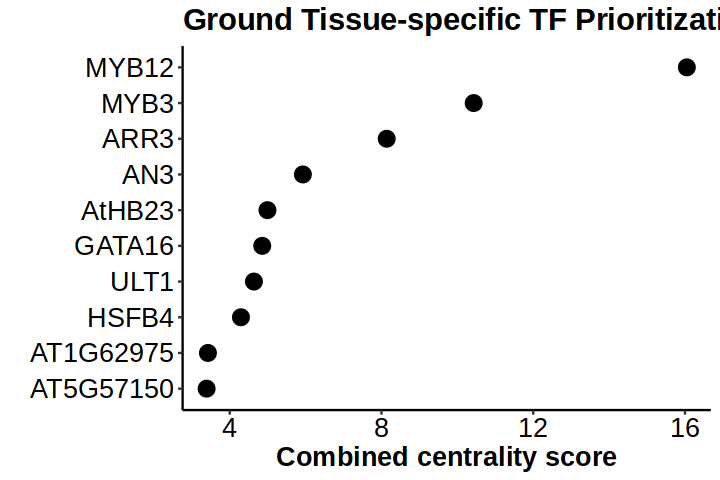

In [229]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(ground_rank[1:10,], aes(x=reorder(GeneName, ground, decreasing = FALSE),  y=ground)) + geom_point(size=4)+ 
  labs(title="Ground Tissue-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [1301]:
write.csv(ground_rank,"Ground_Tissue_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [1302]:
tf_rank <- ground_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [1303]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

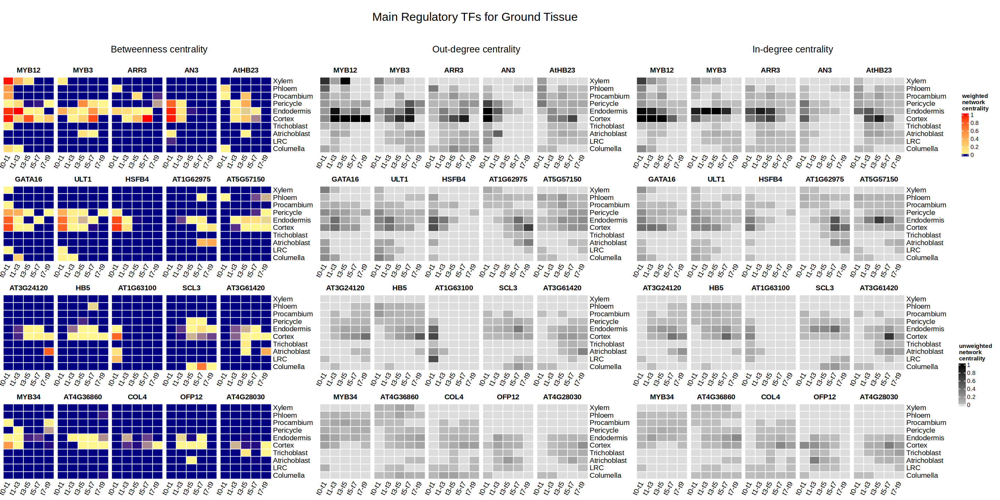

In [1304]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Ground Tissue ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Epidermis

In [121]:
epi_rank <- bc_rank[which(bc_rank$epi*2 > bc_rank$all),]%>% arrange(desc(epi))
epi_rank <- epi_rank[-c(match(rownames(atri_rank), rownames(epi_rank)),match(rownames(tri_rank), rownames(epi_rank))),]
epi_rank$GeneName <- rownames(epi_rank)

In [122]:
epi_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
KDR,15.63637057,5.50850153,5.72027010,0.836563394,0.427781125,0.095169474,0.000000000,0.00000000,0.000000000,2.997848939,0.050236005,AT1G26945,1.264344519,11.22877163,0.095169474,14.22662057,3.048084944,KDR
MYB23,17.41583495,7.91650475,3.14725289,1.032895899,0.214463455,0.000000000,0.000000000,0.00000000,0.000000000,5.011080445,0.093637514,AT5G40330,1.247359354,11.06375763,0.000000000,16.07483808,5.104717959,MYB23
ATS,17.65096816,5.17751248,4.08309220,1.121933126,0.820489845,0.047344564,0.000000000,0.00000000,0.000000000,6.028496767,0.372099180,AT5G42630,1.942422971,9.26060468,0.047344564,15.28910145,6.400595947,ATS
ARR5,9.75929636,4.35875276,3.80574116,0.238071851,0.192309442,0.014950033,0.167717646,0.00000000,0.168027211,0.489912867,0.323813394,AT3G48100,0.430381293,8.16449392,0.350694890,8.65440679,0.813726262,ARR5
ATMYC1,9.80811233,3.70117609,4.34305282,1.095044031,0.562222780,0.106616602,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,AT4G00480,1.657266811,8.04422891,0.106616602,8.04422891,0.000000000,ATMYC1
ATHB13,13.41075230,3.89415528,3.69945422,1.352345733,1.251681506,0.670197321,0.352521349,0.00000000,0.318160955,1.829539903,0.042696030,AT1G69780,2.604027239,7.59360950,1.340879625,9.42314941,1.872235933,ATHB13
RSL1,7.39076516,3.28965109,3.21992453,0.418898344,0.457088570,0.005202625,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,AT5G37800,0.875986914,6.50957562,0.005202625,6.50957562,0.000000000,RSL1
NFL,10.88309411,3.63496826,2.68247443,1.268092591,1.101495379,0.000000000,0.000000000,0.00000000,0.000000000,1.922524399,0.273539040,AT5G65640,2.369587970,6.31744270,0.000000000,8.23996710,2.196063439,NFL
GATA12,12.17640944,1.81910371,4.49478753,0.108824050,0.000000000,0.261791106,0.306764326,4.28527569,0.407810048,0.400064128,0.091988854,AT5G25830,0.108824050,6.31389124,5.261641170,6.71395537,0.492052982,GATA12


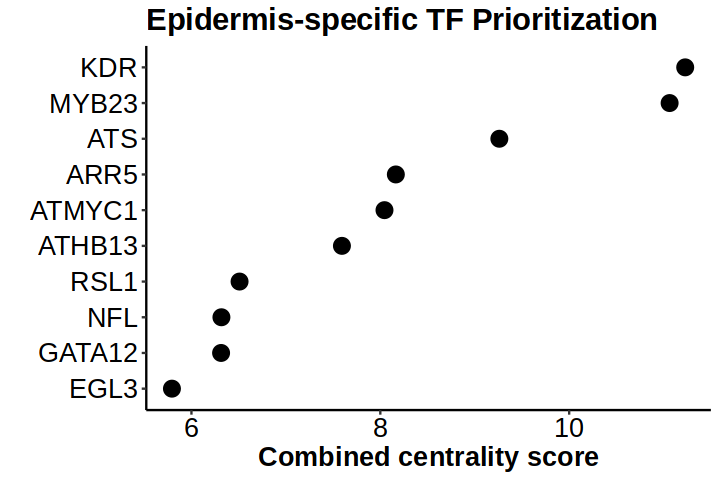

In [230]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(epi_rank[1:10,], aes(x=reorder(GeneName, epi, decreasing = FALSE),  y=epi)) + geom_point(size=4)+ 
  labs(title="Epidermis-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [1307]:
write.csv(epi_rank,"Epidermis_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [1308]:
tf_rank <- epi_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [1309]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

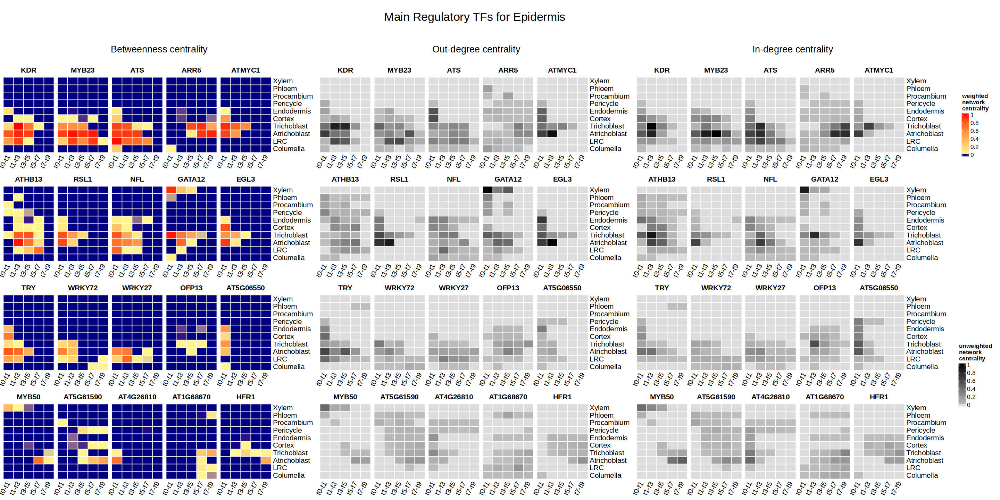

In [1310]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Epidermis ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Epidermis + LRC

In [125]:
epilrc_rank <- bc_rank[which(bc_rank$epilrc*2 > bc_rank$all),]%>% arrange(desc(epilrc))
epilrc_rank <- epilrc_rank[-c(match(rownames(atri_rank), rownames(epilrc_rank)),match(rownames(tri_rank), rownames(epilrc_rank)),match(rownames(lrc_rank), rownames(epilrc_rank))),]
epilrc_rank$GeneName <- rownames(epilrc_rank)

In [126]:
epilrc_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GATA2,30.677473,7.8534131,5.533161034,2.4451137,1.38259307,0.50181676,0.08967606,0.05936252,0.462778785,10.4048628,1.94469509,AT2G45050,3.8277068,13.3865741,1.11363412,23.791437,12.3495579,GATA2
HAT7,32.324147,7.0540648,5.626398815,8.9965981,4.91031527,0.02122024,0.00000000,0.00000000,0.000000000,4.4330601,1.28248975,AT5G15150,13.9069134,12.6804636,0.02122024,17.113524,5.7155498,HAT7
MYB23,17.415835,7.9165047,3.147252887,1.0328959,0.21446346,0.00000000,0.00000000,0.00000000,0.000000000,5.0110804,0.09363751,AT5G40330,1.2473594,11.0637576,0.00000000,16.074838,5.1047180,MYB23
CRF2,28.881788,4.5879796,2.175573608,2.2096198,1.70007169,2.54559752,0.39109962,0.15510466,2.724359039,8.9251989,3.46718327,AT4G23750,3.9096915,6.7635533,5.81616083,15.688752,12.3923822,CRF2
ATS,17.650968,5.1775125,4.083092197,1.1219331,0.82048984,0.04734456,0.00000000,0.00000000,0.000000000,6.0284968,0.37209918,AT5G42630,1.9424230,9.2606047,0.04734456,15.289101,6.4005959,ATS
BT2,21.716559,4.2550728,1.229291484,0.2692809,0.01052632,0.00000000,0.00000000,0.00000000,0.000000000,9.1867705,6.76561708,AT3G48360,0.2798072,5.4843643,0.00000000,14.671135,15.9523876,BT2
NAI1,25.350401,3.3551095,0.367456996,1.2531594,0.05930131,0.00000000,0.00000000,0.00000000,0.000000000,10.7691324,9.54624150,AT2G22770,1.3124607,3.7225665,0.00000000,14.491699,20.3153739,NAI1
CRF3,20.564564,3.2745045,2.361877234,1.3429950,0.89743390,0.18772725,0.02324283,0.00000000,0.000000000,8.6413544,3.83542869,AT5G53290,2.2404289,5.6363817,0.21097009,14.277736,12.4767830,CRF3
KDR,15.636371,5.5085015,5.720270099,0.8365634,0.42778112,0.09516947,0.00000000,0.00000000,0.000000000,2.9978489,0.05023601,AT1G26945,1.2643445,11.2287716,0.09516947,14.226621,3.0480849,KDR


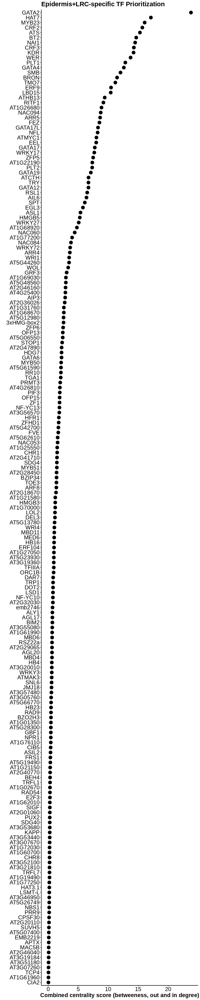

In [132]:
options(repr.plot.width=8, repr.plot.height=40)
ggplot(epilrc_rank, aes(x=reorder(GeneName, epilrc, decreasing = FALSE),  y=epilrc)) + geom_point(size=4)+ 
  labs(title="Epidermis+LRC-specific TF Prioritization",x="", y = "Combined centrality score (betweeness, out and in degree)")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [1313]:
write.csv(epilrc_rank,"Epidermis_LRC_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [1314]:
tf_rank <- epilrc_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [1315]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

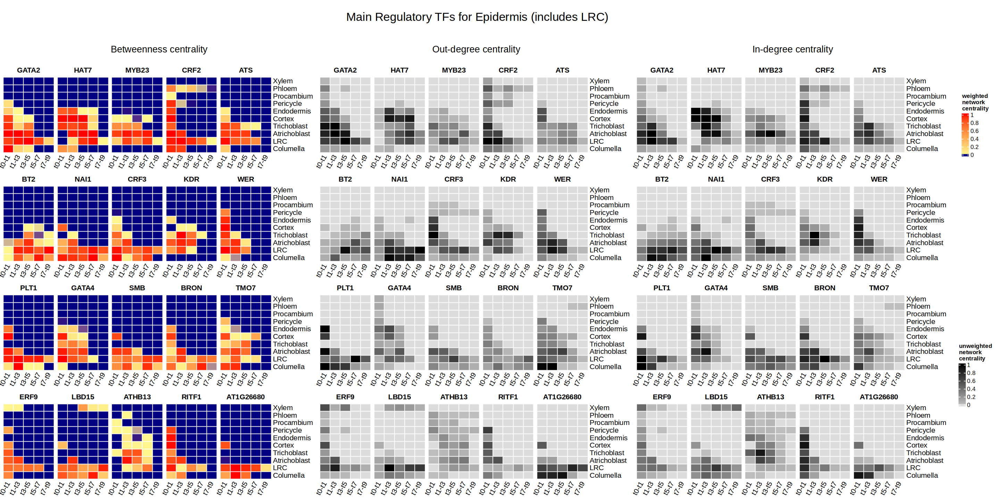

In [1316]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Epidermis (includes LRC)", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Stele

In [133]:
stele_rank <- bc_rank[which(bc_rank$stele*2 > bc_rank$all),]%>% arrange(desc(stele))
stele_rank <- stele_rank[-c(match(rownames(per_rank), rownames(stele_rank)),match(rownames(pro_rank), rownames(stele_rank)),match(rownames(xyl_rank), rownames(stele_rank)),match(rownames(phl_rank), rownames(stele_rank))),]
stele_rank$GeneName <- rownames(stele_rank)

In [134]:
stele_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
BZIP9,31.71447,0.00000000,0.000000000,0.000000000,0.006698565,8.0463558,11.944304,0.03622764,11.680885,0.00000000,0.00000000,AT5G24800,0.006698565,0.000000000,31.70777,0.000000000,0.00000000,BZIP9
AT3G43430,29.50134,0.00000000,0.000000000,0.005375774,0.006698565,8.9241430,10.033691,3.50786160,7.023572,0.00000000,0.00000000,AT3G43430,0.012074338,0.000000000,29.48927,0.000000000,0.00000000,AT3G43430
LEP,35.57643,3.67988635,5.198969256,0.568088689,4.608115051,12.3723072,5.865853,0.21451060,2.929608,0.13909305,0.00000000,AT5G13910,5.176203740,8.878855607,21.38228,9.017948659,0.13909305,LEP
HB-8,20.22047,0.00000000,0.008662067,0.000000000,0.000000000,2.6361377,6.036853,8.18332066,3.355497,0.00000000,0.00000000,AT4G32880,0.000000000,0.008662067,20.21181,0.008662067,0.00000000,HB-8
MYB20,19.03556,0.00000000,0.000000000,0.000000000,0.000000000,5.8160656,7.091989,3.20671764,2.920785,0.00000000,0.00000000,AT1G66230,0.000000000,0.000000000,19.03556,0.000000000,0.00000000,MYB20
HAT2,32.66051,0.00000000,0.000000000,6.841854634,6.821161147,6.2848471,4.586768,2.80786121,4.953272,0.00000000,0.36474865,AT5G47370,13.663015781,0.000000000,18.63275,0.000000000,0.36474865,HAT2
AT1G61660,18.17403,0.00000000,0.000000000,0.000000000,0.003827751,5.2904445,6.741888,1.44004495,4.697828,0.00000000,0.00000000,AT1G61660,0.003827751,0.000000000,18.17021,0.000000000,0.00000000,AT1G61660
AT5G05790,17.03660,0.00000000,0.000000000,0.000000000,0.158795612,6.5991434,3.488748,0.11344400,6.676472,0.00000000,0.00000000,AT5G05790,0.158795612,0.000000000,16.87781,0.000000000,0.00000000,AT5G05790
IAA12,16.82887,0.00000000,0.000000000,0.000000000,0.000000000,1.4006059,7.169331,5.61947935,2.639450,0.00000000,0.00000000,AT1G04550,0.000000000,0.000000000,16.82887,0.000000000,0.00000000,IAA12


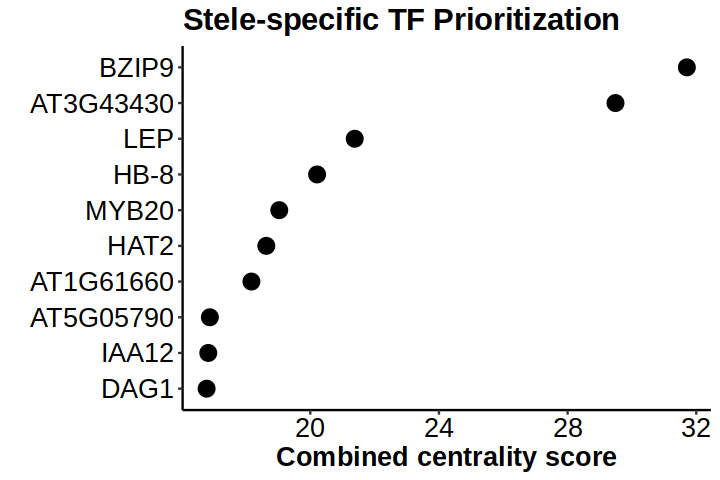

In [231]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(stele_rank[1:10,], aes(x=reorder(GeneName, stele, decreasing = FALSE),  y=stele)) + geom_point(size=4)+ 
  labs(title="Stele-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [1319]:
write.csv(stele_rank,"Stele_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [1320]:
tf_rank <- stele_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [1321]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

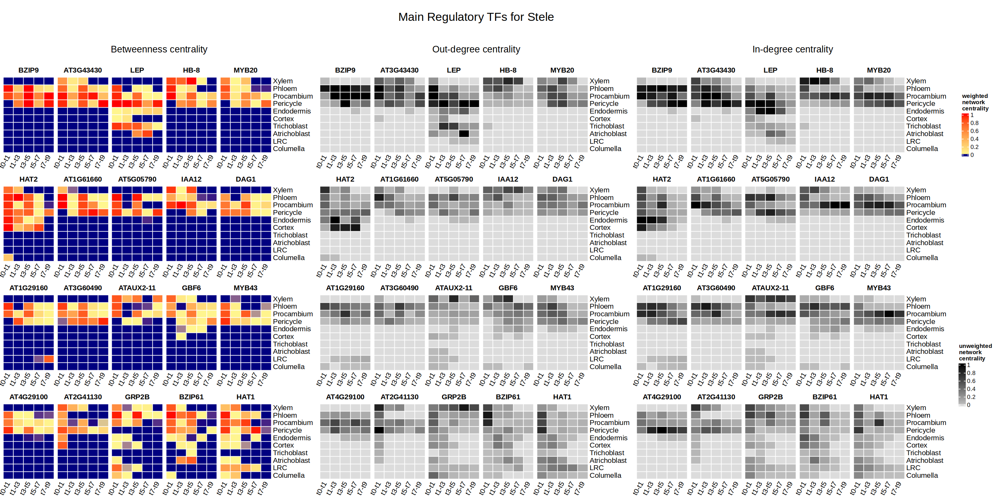

In [1322]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Stele", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Root Cap

In [138]:
rc_rank <- bc_rank[which(bc_rank$rc*2 > bc_rank$all),]%>% arrange(desc(rc))
rc_rank <- rc_rank[-c(match(rownames(lrc_rank), rownames(rc_rank)),match(rownames(col_rank), rownames(rc_rank))),]
rc_rank$GeneName <- rownames(rc_rank)

In [139]:
rc_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
NAI1,25.350401,3.35510951,0.367456996,1.25315937,0.059301306,0.00000000,0.00000000,0.00000000,0.00000000,10.769132,9.546241,AT2G22770,1.312460674,3.72256651,0.00000000,14.491699,20.315374,NAI1
BT2,21.716559,4.25507281,1.229291484,0.26928090,0.010526316,0.00000000,0.00000000,0.00000000,0.00000000,9.186771,6.765617,AT3G48360,0.279807219,5.48436429,0.00000000,14.671135,15.952388,BT2
AT1G32700,19.481028,0.07769675,0.000000000,0.03221927,0.095772000,0.31077520,1.10140689,0.20503616,2.42733679,6.354357,8.876429,AT1G32700,0.127991275,0.07769675,4.04455503,6.432053,15.230785,AT1G32700
AT1G26680,17.203575,0.39270382,0.000000000,1.73518478,0.000000000,0.00000000,0.00000000,0.00000000,0.00000000,8.496138,6.579548,AT1G26680,1.735184777,0.39270382,0.00000000,8.888841,15.075686,AT1G26680
PLT1,22.943416,3.57380550,0.000000000,2.59211779,1.958605076,0.00000000,0.00000000,0.00000000,0.00000000,9.283443,5.535445,AT3G20840,4.550722869,3.57380550,0.00000000,12.857248,14.818888,PLT1
AT1G36060,18.204785,2.34713011,0.468806411,0.68077581,0.240522072,0.01832082,0.00000000,0.00000000,0.00000000,6.149425,8.299804,AT1G36060,0.921297881,2.81593653,0.01832082,8.965362,14.449229,AT1G36060
LBD15,18.810274,1.91536509,0.007969035,0.61761953,0.000000000,0.00000000,0.00000000,2.30414675,0.00000000,8.501162,5.464012,AT2G40470,0.617619534,1.92333413,2.30414675,10.424496,13.965173,LBD15
SMB,19.125611,4.24334879,0.000000000,1.58206588,0.177682110,0.00000000,0.00000000,0.00000000,0.00000000,7.807289,5.315225,AT1G79580,1.759747994,4.24334879,0.00000000,12.050638,13.122514,SMB
CRF3,20.564564,3.27450445,2.361877234,1.34299504,0.897433896,0.18772725,0.02324283,0.00000000,0.00000000,8.641354,3.835429,AT5G53290,2.240428936,5.63638169,0.21097009,14.277736,12.476783,CRF3


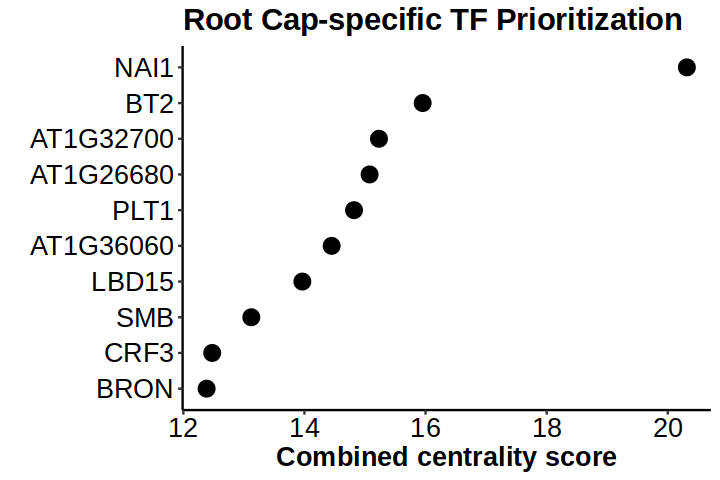

In [232]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(rc_rank[1:10,], aes(x=reorder(GeneName, rc, decreasing = FALSE),  y=rc)) + geom_point(size=4)+ 
  labs(title="Root Cap-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [1325]:
write.csv(stele_rank,"Root_Cap_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [1326]:
tf_rank <- rc_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [1327]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

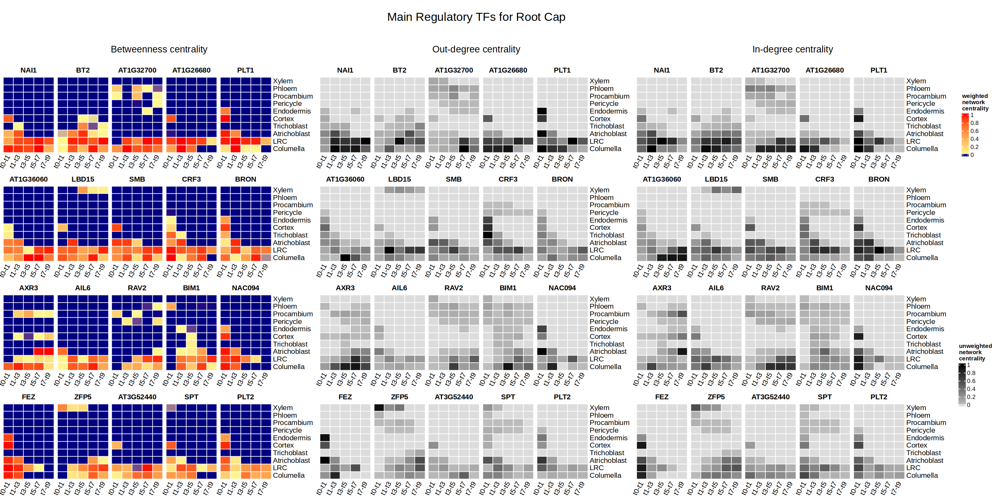

In [1328]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Root Cap", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))